# EMPLOYEE ATTRITION PROJECT

# Problem Statement


Employee attrition poses a significant challenge for organizations, leading to increased recruitment costs, loss of knowledge, and reduced produc 
-tivity. Identifying the factors contributing to employee turnover and predicting potential attrition can help organizations take proactive measures
to retain talent. The objective of this project is to analyze a dataset of employee characteristics, job roles, satisfaction levels, and more to 
develop a predictive model that accurately forecasts employee attrition. By understanding these factors, organizations can implement targeted
strategies to improve employee retention and satisfaction.

Objective: The project aims to predict employee attrition using machine learning techniques. The goal is to identify key factors that contribute to employee turnover and use these insights to build a model that can accurately predict whether an employee is likely to leave the company.

Dataset: The dataset used in this project is from Kaggle and contains 1,470 observations with 35 features, including employee demographics, job roles, satisfaction levels, work-life balance, and more.

#  Importing Libraries and Reading Data

In [2]:
# Data Visualization Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

#import category_encoders
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
from category_encoders import BinaryEncoder

# Model Libraries
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, f1_score
from sklearn.metrics import roc_auc_score
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTEENN
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline

from ipywidgets import widgets, interact
import warnings
warnings.filterwarnings('ignore')

# First look to the data

In [4]:
df = pd.read_csv(r'C:\Users\hp\Downloads\EA dataset.csv')
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [5]:
print("There are {} observations and {} features in this dataset. \n".format(df.shape[0],df.shape[1]))

There are 1470 observations and 35 features in this dataset. 



In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

# Data Quality

## Check Null values in the data

In [9]:
print("There are {} missing values in this dataset. \n".format(df.isnull().sum().sum()))

There are 0 missing values in this dataset. 



## Check duplicates in the data

In [11]:
print("There are {} duplicated values in this dataset. \n".format(df.duplicated().sum()))

There are 0 duplicated values in this dataset. 



## Check the describtion of the data

In [13]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [14]:
df.describe(include='object')

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime
count,1470,1470,1470,1470,1470,1470,1470,1470,1470
unique,2,3,3,6,2,9,3,1,2
top,No,Travel_Rarely,Research & Development,Life Sciences,Male,Sales Executive,Married,Y,No
freq,1233,1043,961,606,882,326,673,1470,1054


In [15]:
numerical_cols = df.select_dtypes(include='number').columns
categorical_cols = df.select_dtypes(exclude='number').columns
print("There are {} numerical features and {} categorical features in this dataset. \n".format(len(numerical_cols),len(categorical_cols)))

There are 26 numerical features and 9 categorical features in this dataset. 



In [16]:
numerical_cols

Index(['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome',
       'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike',
       'PerformanceRating', 'RelationshipSatisfaction', 'StandardHours',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [17]:
categorical_cols

Index(['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender',
       'JobRole', 'MaritalStatus', 'Over18', 'OverTime'],
      dtype='object')

In [18]:
# Look at the target distribution
attrition_counts = df["Attrition"].value_counts(normalize=True)
attrition_counts

Attrition
No     0.838776
Yes    0.161224
Name: proportion, dtype: float64

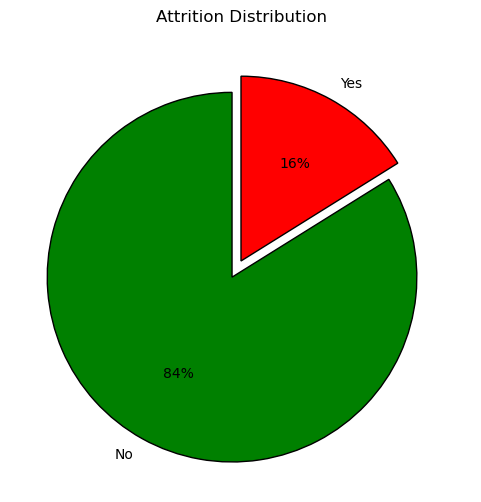

In [19]:
# Vizualize the target distribution
plt.figure(figsize=(6, 6))
plt.pie(attrition_counts, labels=attrition_counts.index, autopct='%1.0f%%', colors=['green','red'], startangle=90, wedgeprops={'edgecolor': 'black'},explode=(0.1, 0))
plt.title('Attrition Distribution');

Data Quality summary:
- There is 1470 row, 35 columns with mixed columns types (Object, Int).
- There is 26 numeric column & 9 categorical.
- The Target (Attrition) is highly ImBalance (Only 16% Left the company).
- No Nulls & No Duplicates.
- There are some Skewenes columns, may be because some outliers in this columns.
- Some columns like (Education) are categorical, but mapped in the data in range from 1 to 4 or 5, with 1 as the lowest category.
- Min age value is 18, so why there is (Over18) column as all of it's values is 'Yes'.
- Column (EmployeeCount) has 0 std which mean all of it's values is '1'.

# Data Analysis

In [22]:
numerical_cols

Index(['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome',
       'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike',
       'PerformanceRating', 'RelationshipSatisfaction', 'StandardHours',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [23]:
categorical_cols

Index(['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender',
       'JobRole', 'MaritalStatus', 'Over18', 'OverTime'],
      dtype='object')

In [24]:
df.sample(5)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1329,29,No,Travel_Rarely,352,Human Resources,6,1,Medical,1,1865,...,4,80,0,1,3,3,1,0,0,0
356,42,No,Travel_Rarely,1332,Research & Development,2,4,Other,1,477,...,2,80,0,14,6,3,1,0,0,0
201,49,No,Non-Travel,1002,Research & Development,18,4,Life Sciences,1,275,...,1,80,2,7,0,3,7,7,1,7
539,50,No,Travel_Rarely,316,Sales,8,4,Marketing,1,738,...,4,80,1,4,2,3,2,2,2,2
1420,41,No,Travel_Rarely,642,Research & Development,1,3,Life Sciences,1,1999,...,1,80,1,12,3,3,5,3,1,0


In [25]:
df.nunique().sort_values(ascending=True)

Over18                         1
StandardHours                  1
EmployeeCount                  1
Gender                         2
Attrition                      2
PerformanceRating              2
OverTime                       2
MaritalStatus                  3
Department                     3
BusinessTravel                 3
StockOptionLevel               4
EnvironmentSatisfaction        4
JobInvolvement                 4
JobSatisfaction                4
RelationshipSatisfaction       4
WorkLifeBalance                4
Education                      5
JobLevel                       5
EducationField                 6
TrainingTimesLastYear          7
JobRole                        9
NumCompaniesWorked            10
PercentSalaryHike             15
YearsSinceLastPromotion       16
YearsWithCurrManager          18
YearsInCurrentRole            19
DistanceFromHome              29
YearsAtCompany                37
TotalWorkingYears             40
Age                           43
HourlyRate

#### Analyzing Attrition column

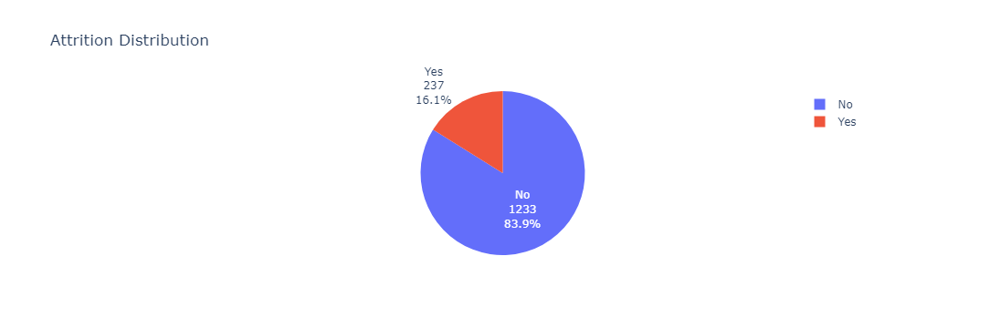

In [27]:
fig = px.pie(df,'Attrition', title='Attrition Distribution')
fig.update_traces(textinfo='label+value+percent')
fig.show()

This is imbalanced data. Most employees are not attiritoned.

In [29]:
df['Attrition_2'] = df['Attrition'].map({'No':0, 'Yes':1})

#### Analyzing Categorical columns

In [31]:
df[categorical_cols].nunique().sort_values(ascending=True)

Over18            1
Attrition         2
Gender            2
OverTime          2
BusinessTravel    3
Department        3
MaritalStatus     3
EducationField    6
JobRole           9
dtype: int64

In [32]:
categorical_cols

Index(['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender',
       'JobRole', 'MaritalStatus', 'Over18', 'OverTime'],
      dtype='object')

#### Gender Column

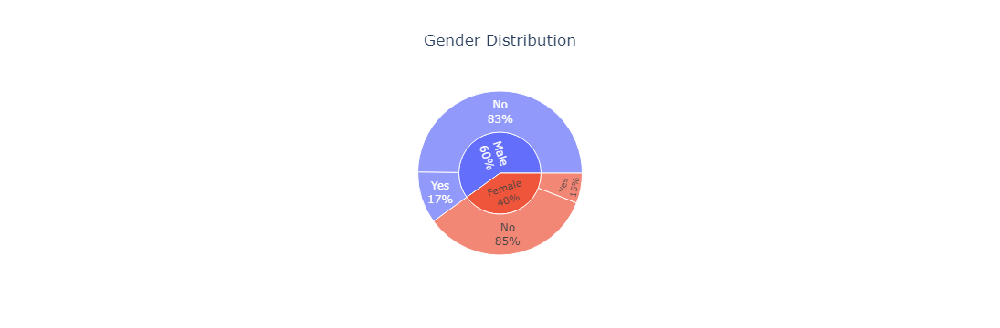

In [34]:
fig = px.sunburst(df,path=['Gender','Attrition'], title='Gender Distribution')
fig.update_traces(textinfo='label+percent parent')
fig.update_layout(title_x=0.5)
fig.show()

The probability of attrition is almost equal for each gender although the data deals with males more than females

#### OverTime column

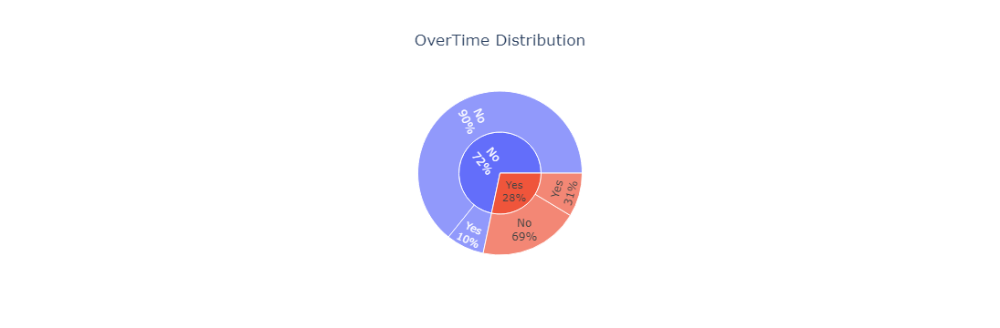

In [37]:
fig = px.sunburst(df,path=['OverTime','Attrition'], title='OverTime Distribution')
fig.update_traces(textinfo='label+percent parent')
fig.update_layout(title_x=0.5)
fig.show()

Overtime employees are more probably to be attritioned.

#### BusinessTravel column

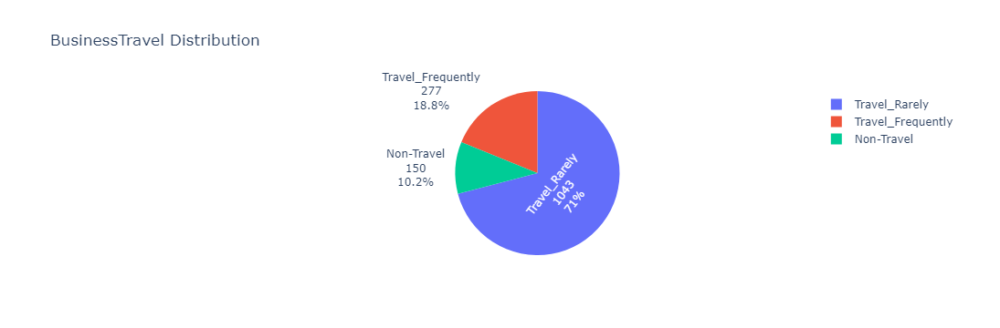

In [40]:
fig = px.pie(df,'BusinessTravel', title='BusinessTravel Distribution')
fig.update_traces(textinfo='label+value+percent')
fig.show()

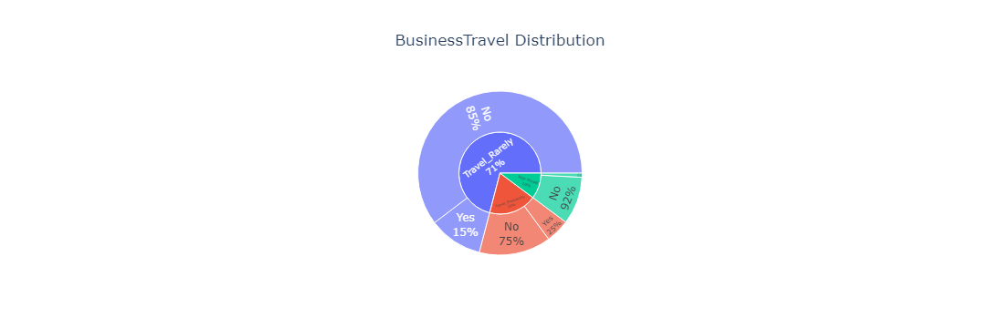

In [41]:
fig = px.sunburst(df,path=['BusinessTravel','Attrition'], title='BusinessTravel Distribution')
fig.update_traces(textinfo='label+percent parent')
fig.update_layout(title_x=0.5)
fig.show()

The majority of employees travel rarely. Although noticed that as the travel frequency increase, the probability of the employee to get attritioned increase.

#### Department column

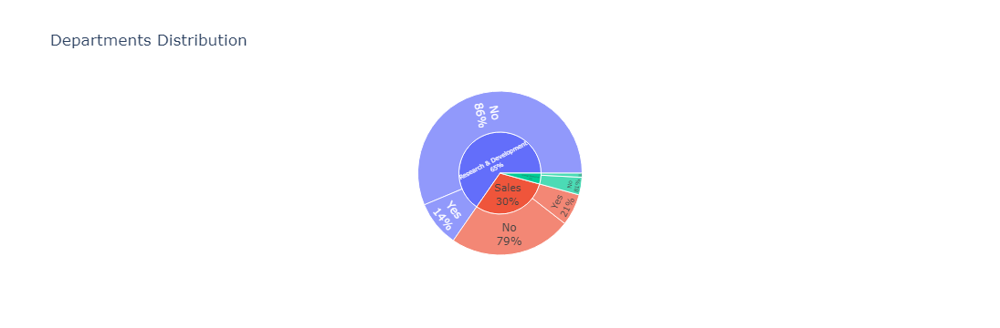

In [44]:
fig = px.sunburst(df,path=['Department','Attrition'], title='Departments Distribution')
fig.update_traces(textinfo='label+percent parent')
fig.show()

Most employees are in Research & Development department, then Sales and the least one is Human Resources.\
Employees in Sales department have the highest probability to get attritioned.

#### MaritalStatus column

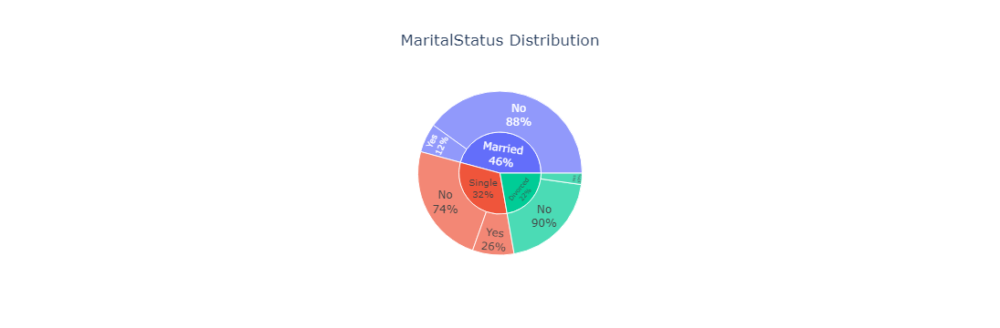

In [47]:
fig = px.sunburst(df,path=['MaritalStatus','Attrition'], title='MaritalStatus Distribution')
fig.update_traces(textinfo='label+percent parent')
fig.update_layout(title_x=0.5)
fig.show()

Around half of the employees are married. Some are single and the least percentage is divorced.\
Single employees are most probably to get attritioned while the divorced ones have the least probability.

#### EducationField column

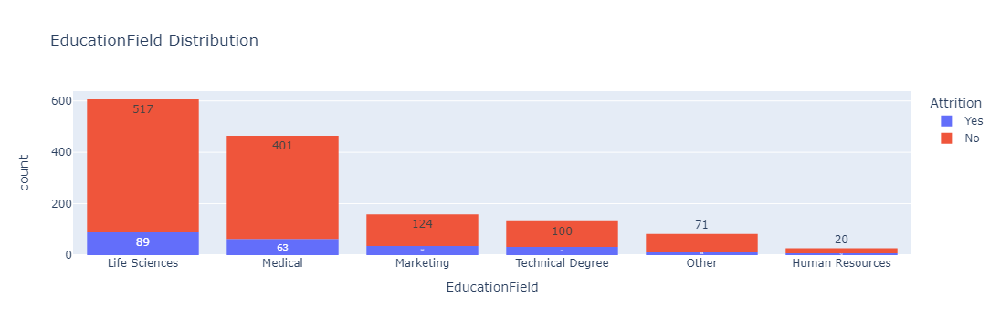

In [50]:
fig = px.histogram(df, x='EducationField', color='Attrition', text_auto=True, title='EducationField Distribution')
fig.update_xaxes(categoryorder="total descending")
fig.show()

Life Sciences is the most common education field and Human Resources is the least one. It's noticed that the percentage of attrition is proportional to how common the education field is, no exceptions.

#### JobRole column

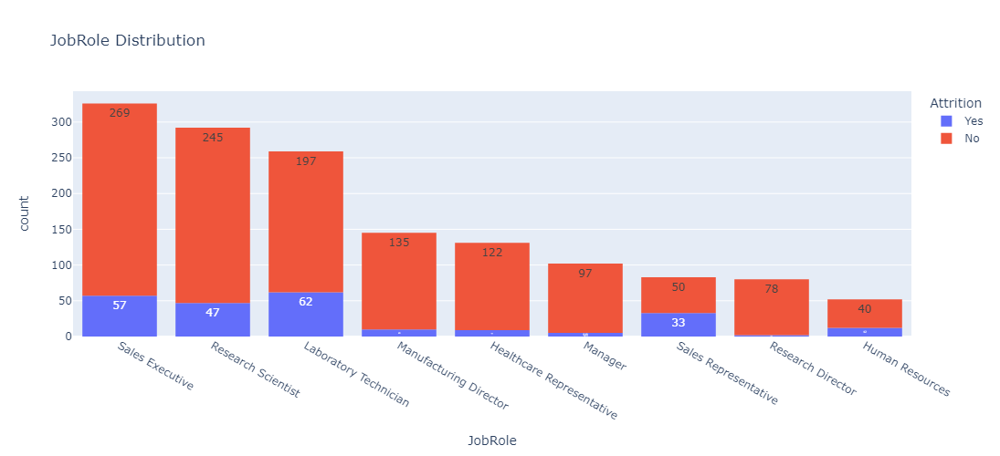

In [53]:
fig = px.histogram(df, x='JobRole', color='Attrition', text_auto=True, title='JobRole Distribution', height =500)
fig.update_xaxes(categoryorder="total descending")
fig.show()

Sale Executive is the most common JobRole while HR is the least one. (HR was the least is Education Field)\
The probability of attrition mainly increase in Laboratory Technician & Sales Representative roles and decrease in Manager, Healthcare Representative & Manufacturing Director.

#### Analyzing relations between categorical columns

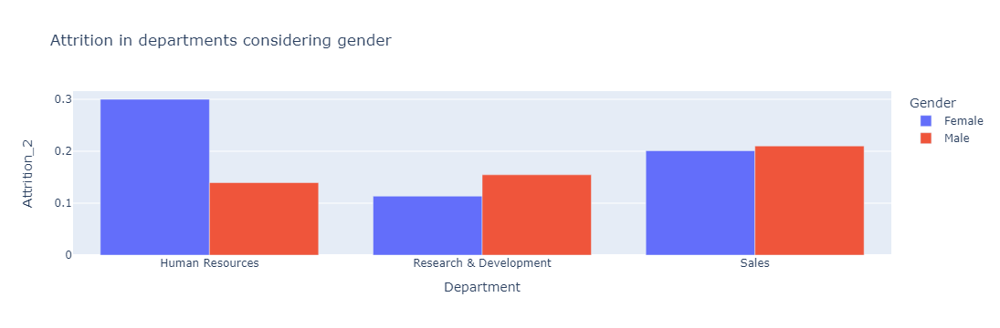

In [56]:
pivot_table = df.pivot_table(values='Attrition_2', index='Department', columns='Gender')
pivot_table.reset_index(inplace=True)
fig = px.bar(pivot_table,
             x='Department',
             y=pivot_table.columns[1:],
             title='Attrition in departments considering gender',
             labels={'value': 'Attrition_2', 'Gender': 'Gender'},
             barmode='group')
fig.update_layout(legend_title_text='Gender')
fig.show()

In departments, males are slightly high probable to get attritioned except for HR department.

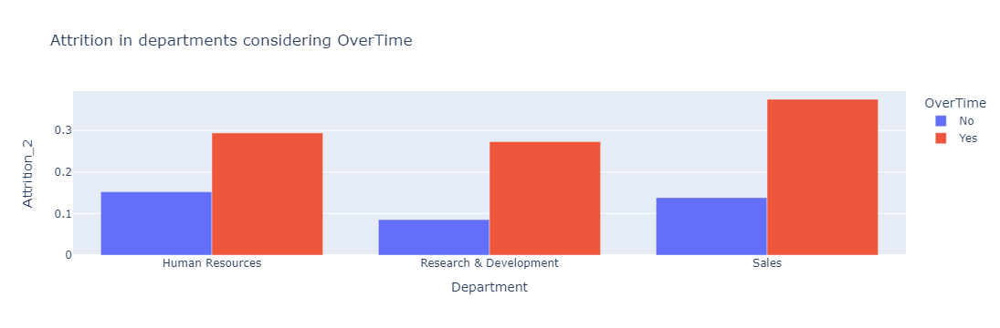

In [58]:
pivot_table = df.pivot_table(values='Attrition_2', index='Department', columns='OverTime')
pivot_table.reset_index(inplace=True)
fig = px.bar(pivot_table,
             x='Department',
             y=pivot_table.columns[1:],
             title='Attrition in departments considering OverTime',
             labels={'value': 'Attrition_2', 'OverTime': 'OverTime'},
             barmode='group')
fig.update_layout(legend_title_text='OverTime')
fig.show()

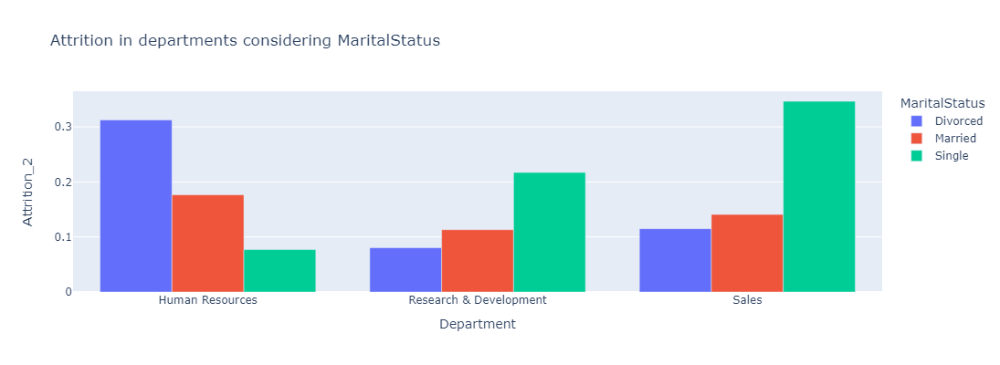

In [59]:
pivot_table = df.pivot_table(values='Attrition_2', index='Department', columns='MaritalStatus')
pivot_table.reset_index(inplace=True)
fig = px.bar(pivot_table,
             x='Department',
             y=pivot_table.columns[1:],
             title='Attrition in departments considering MaritalStatus',
             labels={'value': 'Attrition_2', 'MaritalStatus': 'MaritalStatus'},
             barmode='group', height=400)
fig.update_layout(legend_title_text='MaritalStatus')
fig.show()

Single employees are highly probable to get attritioned in Sales & R&D departemtns. On the other hand, in HR the divorced are the highest type.

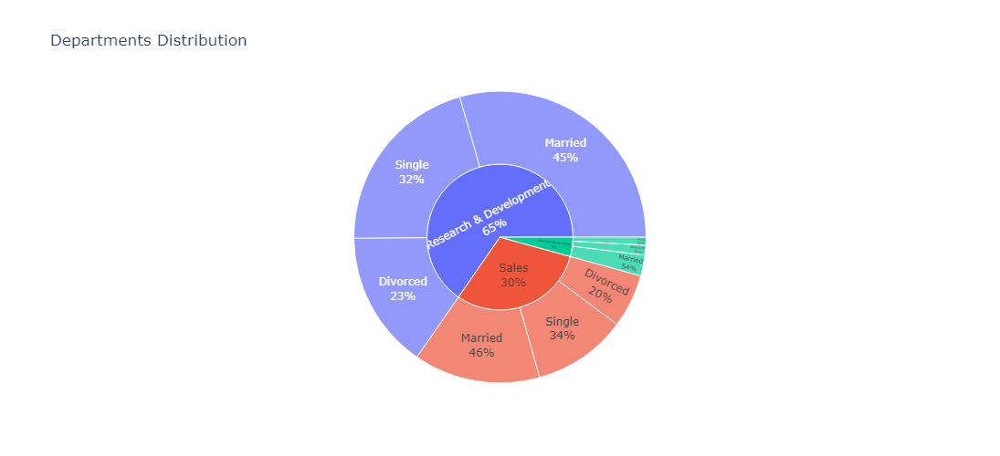

In [61]:
fig = px.sunburst(df,path=['Department','MaritalStatus'], title='Departments Distribution', height=500)
fig.update_traces(textinfo='label+percent parent')
fig.show()

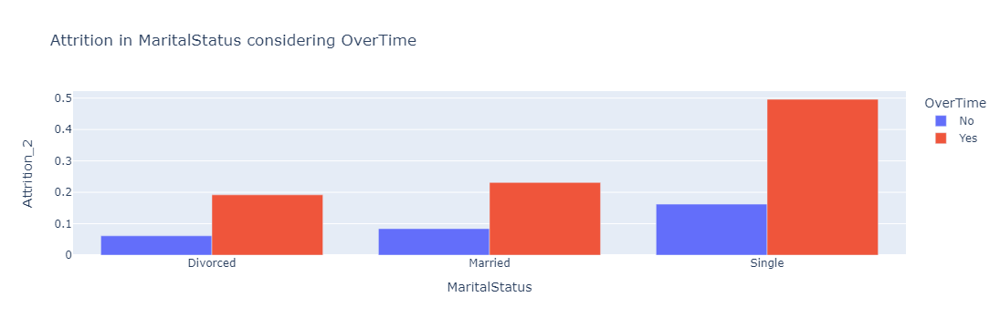

In [62]:
pivot_table = df.pivot_table(values='Attrition_2', index='MaritalStatus', columns='OverTime')
pivot_table.reset_index(inplace=True)
fig = px.bar(pivot_table,
             x='MaritalStatus',
             y=pivot_table.columns[1:],
             title='Attrition in MaritalStatus considering OverTime',
             labels={'value': 'Attrition_2', 'OverTime': 'OverTime'},
             barmode='group')
fig.update_layout(legend_title_text='OverTime')
fig.show()

Working overtime for single employees lead to more probablitiy to get attritioned than for married or divorced people.

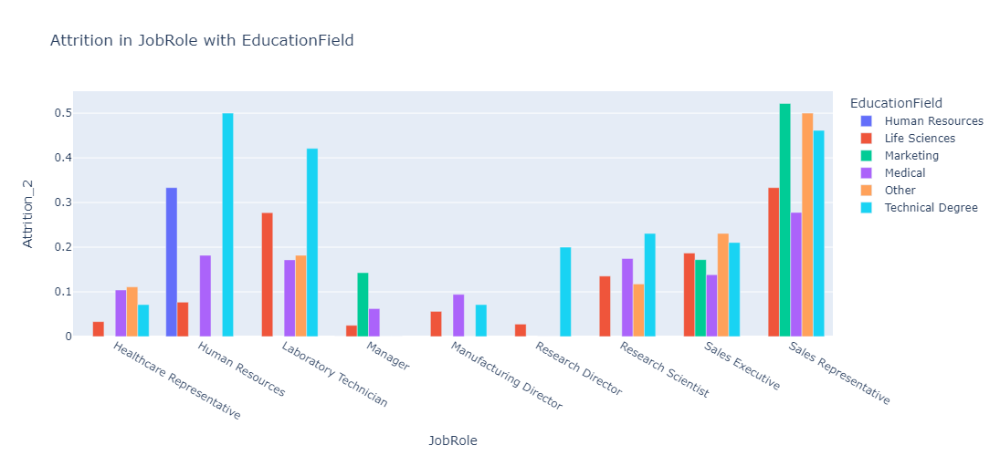

In [64]:
pivot_table = df.pivot_table(values='Attrition_2', index='JobRole', columns='EducationField')
pivot_table.reset_index(inplace=True)
fig = px.bar(pivot_table,
             x='JobRole',
             y=pivot_table.columns[1:],
             title='Attrition in JobRole with EducationField',
             labels={'value': 'Attrition_2', 'EducationField': 'EducationField'},
             barmode='group', height=500)
fig.update_layout(legend_title_text='EducationField')
fig.show()

Technical Degree is obviously related with high probability to get attritioned.\
Sales representative has higher probabilites with most education fields than other job roles.

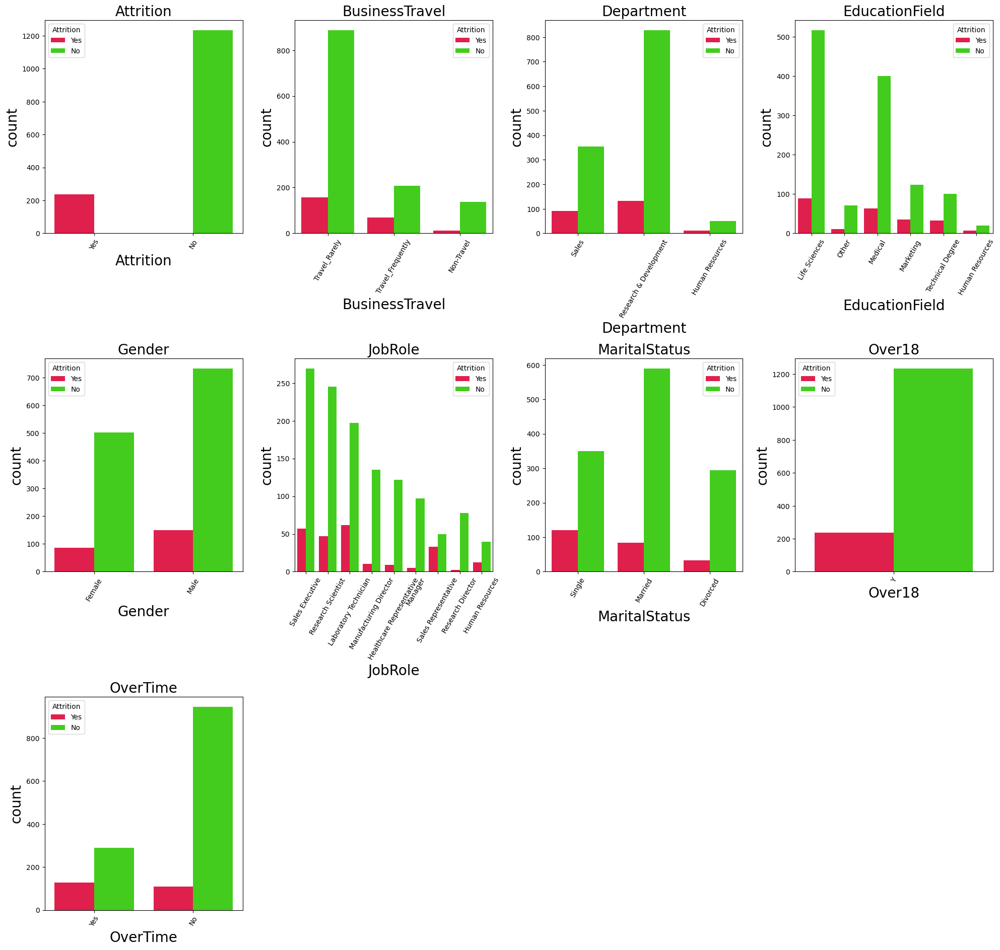

In [66]:
plt.figure(figsize=(20,25), facecolor='white')

plotnumber = 1
for column in df[categorical_cols]:
    ax = plt.subplot(4,4,plotnumber)
    sns.countplot(x=df[column], hue=df.Attrition, palette='prism_r')
    plt.title(column, fontsize=20)
    plt.xticks(rotation=60)
    plt.xlabel(column, fontsize=20)
    plt.ylabel('count', fontsize=20)

    plotnumber += 1

plt.tight_layout()
plt.show()

In [67]:
numerical_cols

Index(['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome',
       'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike',
       'PerformanceRating', 'RelationshipSatisfaction', 'StandardHours',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [68]:
df[numerical_cols].nunique().sort_values(ascending=True)

StandardHours                  1
EmployeeCount                  1
PerformanceRating              2
RelationshipSatisfaction       4
EnvironmentSatisfaction        4
WorkLifeBalance                4
JobInvolvement                 4
StockOptionLevel               4
JobSatisfaction                4
JobLevel                       5
Education                      5
TrainingTimesLastYear          7
NumCompaniesWorked            10
PercentSalaryHike             15
YearsSinceLastPromotion       16
YearsWithCurrManager          18
YearsInCurrentRole            19
DistanceFromHome              29
YearsAtCompany                37
TotalWorkingYears             40
Age                           43
HourlyRate                    71
DailyRate                    886
MonthlyIncome               1349
MonthlyRate                 1427
EmployeeNumber              1470
dtype: int64

#### PerformanceRating column

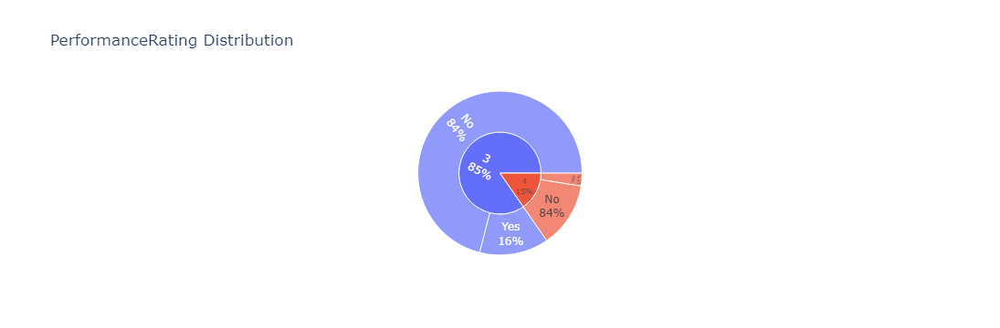

In [70]:
fig = px.sunburst(df,path=['PerformanceRating','Attrition'], title='PerformanceRating Distribution')
fig.update_traces(textinfo='label+percent parent')
fig.show()

Most empoloyees have 3 as performance rating and the others have 4. However, both are equally to be attritioned.

#### WorkLifeBalance column

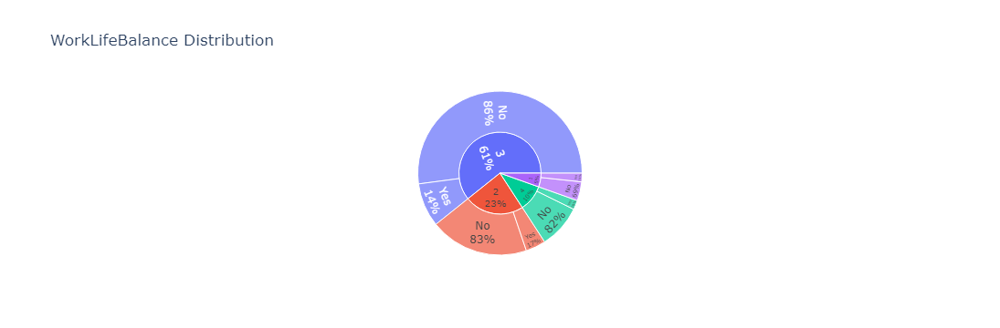

In [73]:
fig = px.sunburst(df,path=['WorkLifeBalance','Attrition'], title='WorkLifeBalance Distribution')
fig.update_traces(textinfo='label+percent parent')
fig.show()

The majority of employees have 3 as worklife balance. As the number decrease, the probability to get attritioned increase except for 4.

#### EnvironmentSatisfaction column

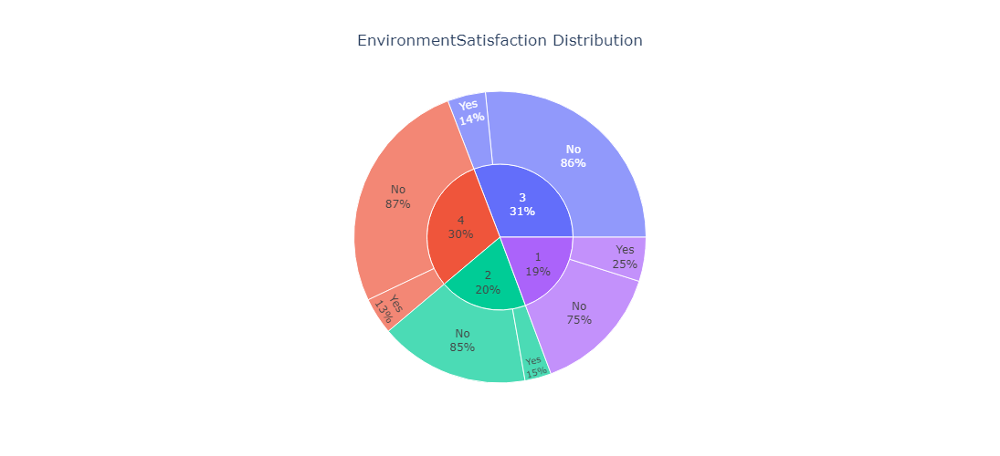

In [76]:
fig = px.sunburst(df,path=['EnvironmentSatisfaction','Attrition'], title='EnvironmentSatisfaction Distribution', height=500)
fig.update_traces(textinfo='label+percent parent')
fig.update_layout(title_x=0.5)
fig.show()

Most EnvironmentSatisfaction are 3 and 4. The less EnvironmentSatisfaction, the more probable for employee to get attritioned.

#### StockOptionLevel column

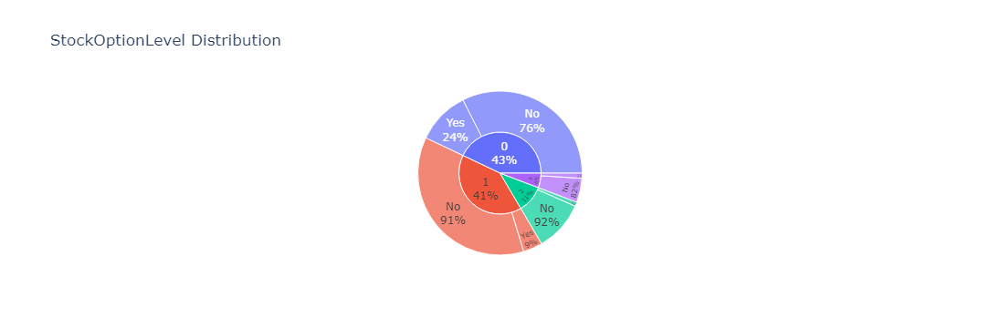

In [79]:
fig = px.sunburst(df,path=['StockOptionLevel','Attrition'], title='StockOptionLevel Distribution')
fig.update_traces(textinfo='label+percent parent')
fig.show()

The higher StockOptionLevel, the less probability to get attritioned, except for 3 as more options and more work.

#### JobInvolvement column

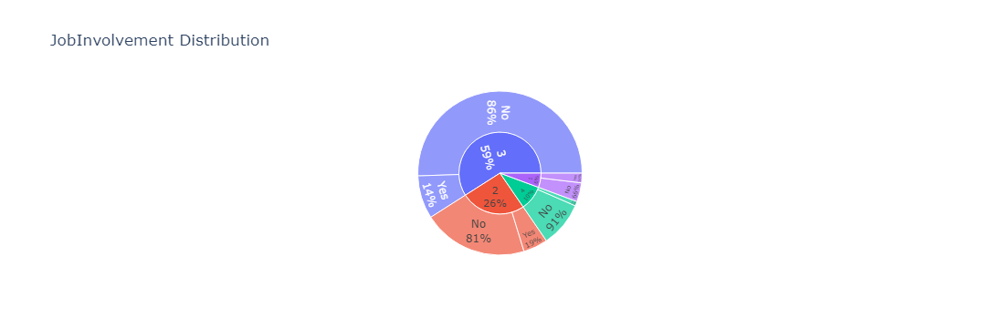

In [82]:
fig = px.sunburst(df,path=['JobInvolvement','Attrition'], title='JobInvolvement Distribution')
fig.update_traces(textinfo='label+percent parent')
fig.show()

The more job involving, the less probability to get attritioned. Most employees are involoving with degree 3.

#### JobSatisfaction column

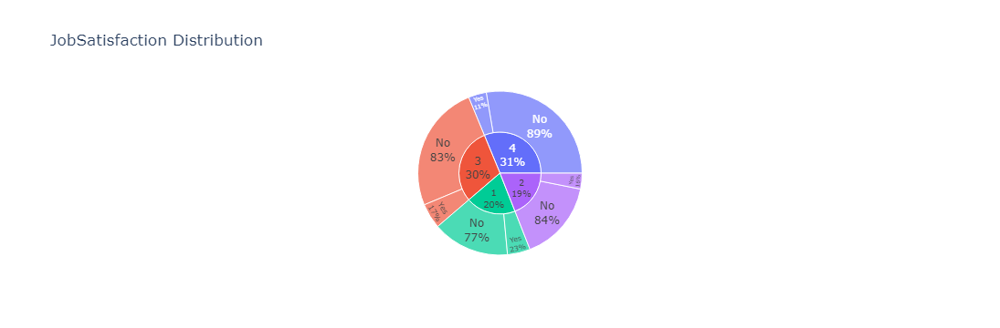

In [85]:
fig = px.sunburst(df,path=['JobSatisfaction','Attrition'], title='JobSatisfaction Distribution')
fig.update_traces(textinfo='label+percent parent')
fig.show()

Many employees are satisfied between 3 & 4. The more satisified the employee, the less probability to get attritioned.

#### RelationshipSatisfaction column

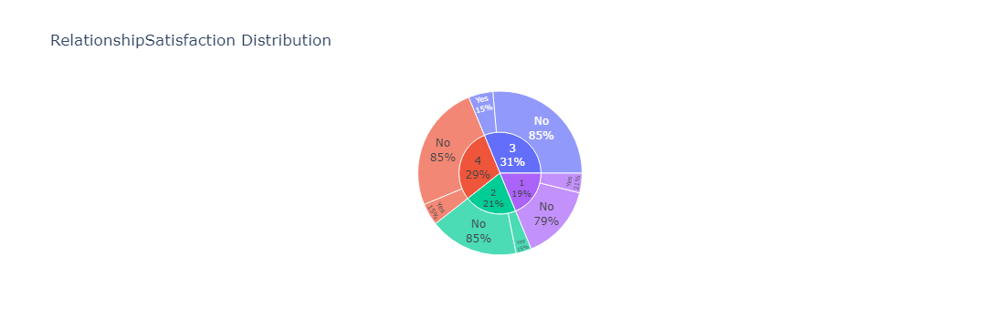

In [88]:
fig = px.sunburst(df,path=['RelationshipSatisfaction','Attrition'], title='RelationshipSatisfaction Distribution')
fig.update_traces(textinfo='label+percent parent')
fig.show()

Employees with RelationshipSatisfaction 1 are more probable to get attritioned. The other degrees have the same probability.

#### Education column

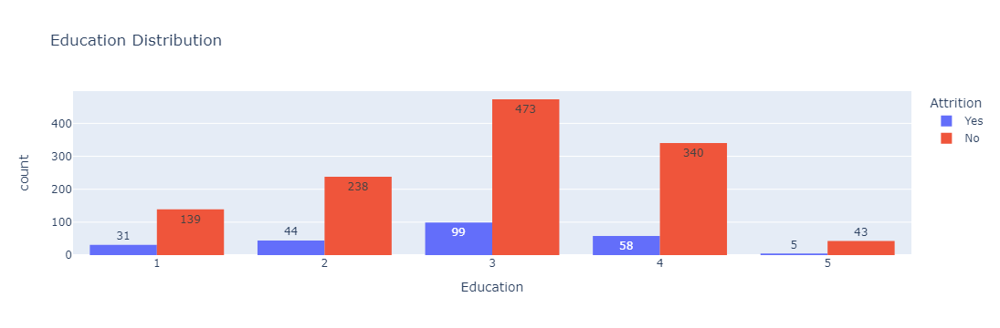

In [91]:
fig = px.histogram(df, x='Education', color='Attrition', text_auto=True, title='Education Distribution', barmode='group')
fig.show()

Most employees are of education 3 and the higher education, the less probability to get attritioned.

#### JobLevel column

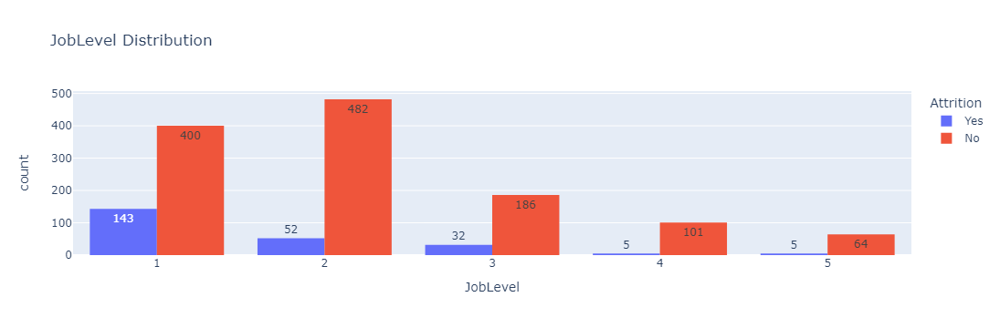

In [94]:
fig = px.histogram(df, x='JobLevel', color='Attrition', text_auto=True, title='JobLevel Distribution', barmode='group')
fig.show()

Most employees are at job level 1 and 2. Employees at job level 1 are highly get attritioned.

#### TrainingTimesLastYear column

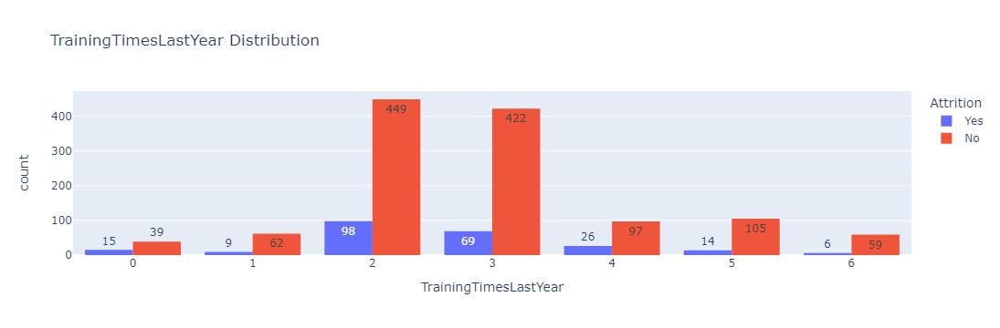

In [97]:
fig = px.histogram(df, x='TrainingTimesLastYear', color='Attrition', text_auto=True, title='TrainingTimesLastYear Distribution', barmode='group')
fig.show()

The majority of employees have trained 2 or 3 times last year. The less training times, the higher probability to get attritioned.

#### NumCompaniesWorked column

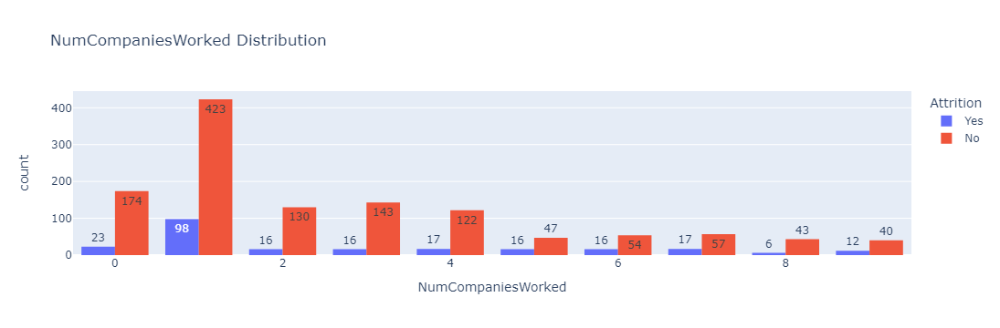

In [100]:
fig = px.histogram(df, x='NumCompaniesWorked', color='Attrition', text_auto=True, title='NumCompaniesWorked Distribution', barmode='group')
fig.show()

Most employees had worked at one company.

#### PercentSalaryHike column

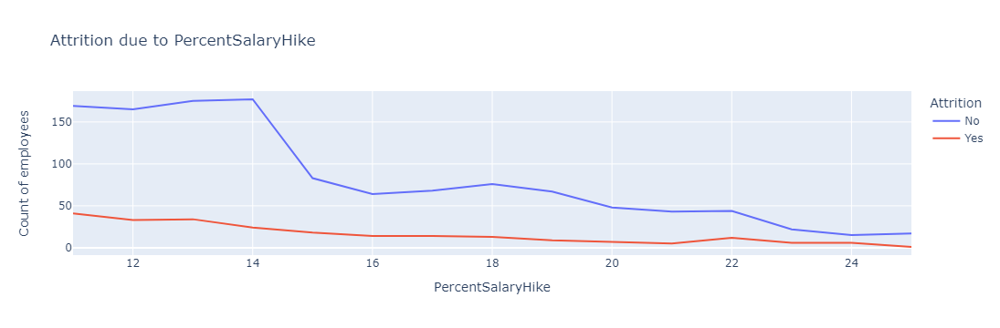

In [103]:
cnt_PercentSalaryHike = df.groupby(['PercentSalaryHike','Attrition'])['EmployeeNumber'].count().reset_index()
fig = px.line(cnt_PercentSalaryHike, x="PercentSalaryHike", y='EmployeeNumber', color='Attrition',
              title='Attrition due to PercentSalaryHike ')
fig.update_yaxes(title='Count of employees')
fig.show()

#### YearsSinceLastPromotion column

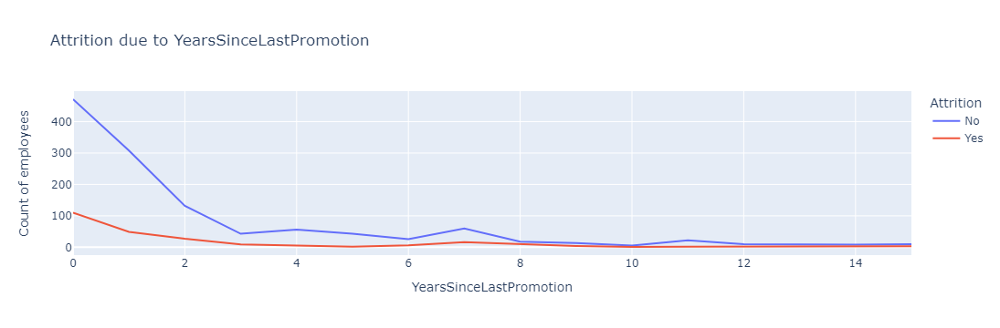

In [105]:
cnt_YearsSinceLastPromotion = df.groupby(['YearsSinceLastPromotion','Attrition'])['EmployeeNumber'].count().reset_index()
fig = px.line(cnt_YearsSinceLastPromotion, x="YearsSinceLastPromotion", y='EmployeeNumber', color='Attrition',
              title='Attrition due to YearsSinceLastPromotion ')
fig.update_yaxes(title='Count of employees')
fig.show()

As the YearsSinceLastPromotion incearse, the probability to get attritioned increase.

#### YearsWithCurrManager column

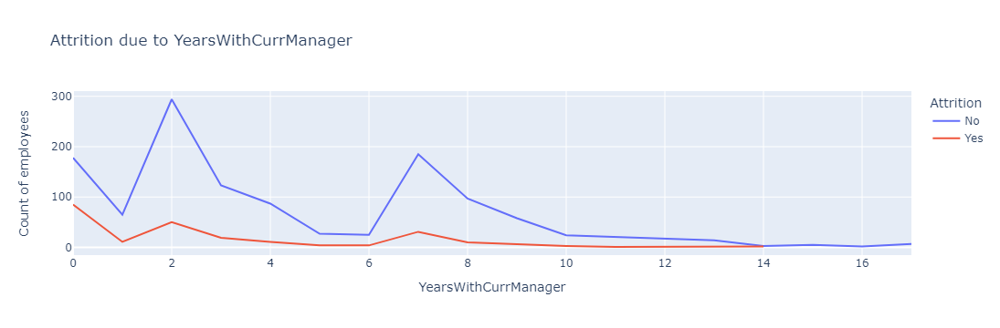

In [108]:
cnt_YearsWithCurrManager = df.groupby(['YearsWithCurrManager','Attrition'])['EmployeeNumber'].count().reset_index()
fig = px.line(cnt_YearsWithCurrManager, x="YearsWithCurrManager", y='EmployeeNumber', color='Attrition',
              title='Attrition due to YearsWithCurrManager ')
fig.update_yaxes(title='Count of employees')
fig.show()

#### YearsInCurrentRole column

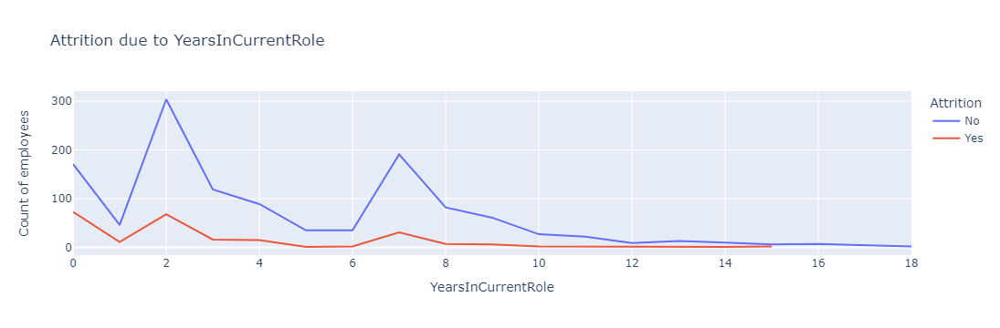

In [110]:
cnt_YearsInCurrentRole = df.groupby(['YearsInCurrentRole','Attrition'])['EmployeeNumber'].count().reset_index()
fig = px.line(cnt_YearsInCurrentRole, x="YearsInCurrentRole", y='EmployeeNumber', color='Attrition',
              title='Attrition due to YearsInCurrentRole ')
fig.update_yaxes(title='Count of employees')
fig.show()

#### DistanceFromHome column

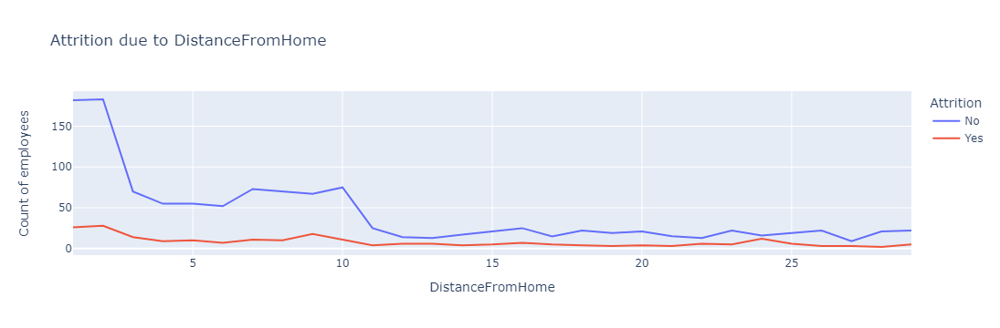

In [112]:
cnt_DistanceFromHome = df.groupby(['DistanceFromHome','Attrition'])['EmployeeNumber'].count().reset_index()
fig = px.line(cnt_DistanceFromHome, x="DistanceFromHome", y='EmployeeNumber', color='Attrition',
              title='Attrition due to DistanceFromHome ')
fig.update_yaxes(title='Count of employees')
fig.show()

As the DistanceFromHome increase, more probability to get attritioned.

#### YearsAtCompany column

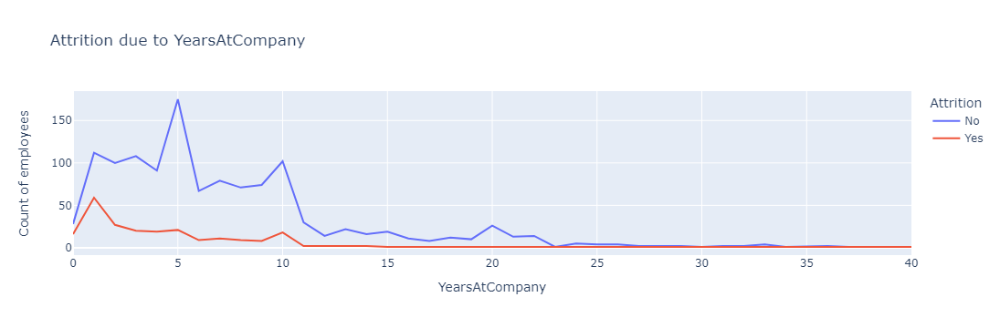

In [115]:
cnt_YearsAtCompany = df.groupby(['YearsAtCompany','Attrition'])['EmployeeNumber'].count().reset_index()
fig = px.line(cnt_YearsAtCompany, x="YearsAtCompany", y='EmployeeNumber', color='Attrition',
              title='Attrition due to YearsAtCompany ')
fig.update_yaxes(title='Count of employees')
fig.show()

#### TotalWorkingYears column

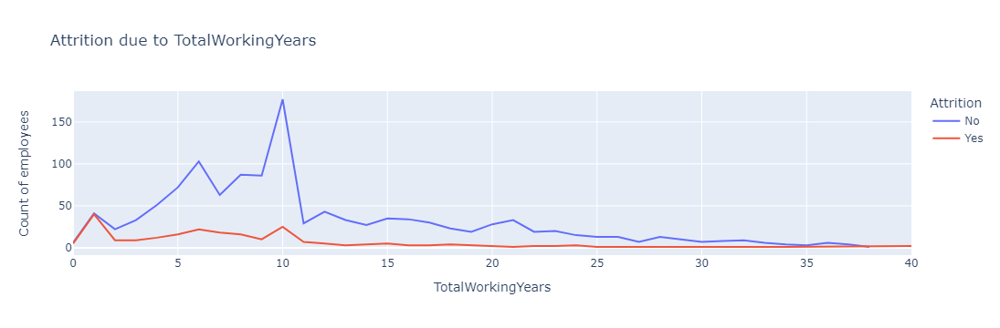

In [117]:
cnt_TotalWorkingYears = df.groupby(['TotalWorkingYears','Attrition'])['EmployeeNumber'].count().reset_index()
fig = px.line(cnt_TotalWorkingYears, x="TotalWorkingYears", y='EmployeeNumber', color='Attrition',
              title='Attrition due to TotalWorkingYears ')
fig.update_yaxes(title='Count of employees')
fig.show()

#### Age column

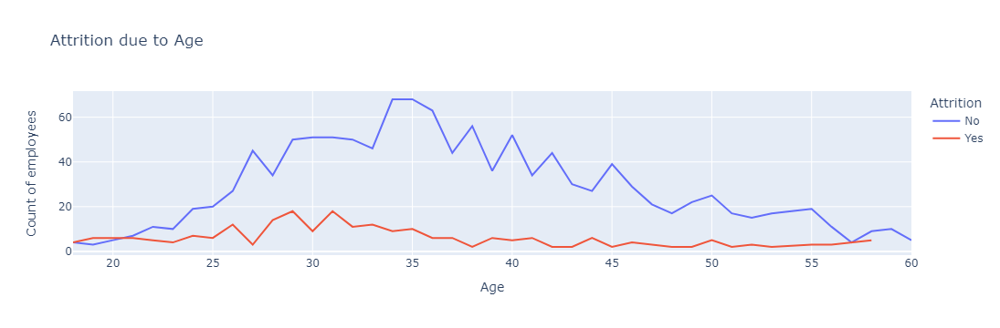

In [119]:
cnt_Age = df.groupby(['Age','Attrition'])['EmployeeNumber'].count().reset_index()
fig = px.line(cnt_Age, x="Age", y='EmployeeNumber', color='Attrition',
              title='Attrition due to Age ')
fig.update_yaxes(title='Count of employees')
fig.show()

The probability of attrition increase in the small & large ages. Small employees are still not stable and search for more opportunities while the old ones retire and can't tolerate hard work anymore.

#### Analyzing relations between columns

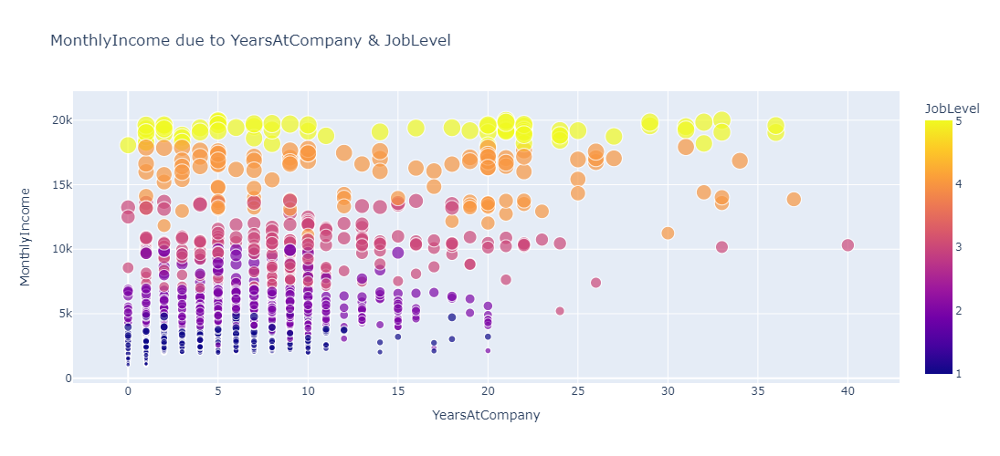

In [122]:
fig = px.scatter(df, x='YearsAtCompany', y='MonthlyIncome',
                 color='JobLevel', size='MonthlyIncome',
                 title='MonthlyIncome due to YearsAtCompany & JobLevel', height=500)
fig.show()

With the same YearsAtCompany, the monthly income increase by the job level. And with inceasing the YearsAtCompany, the monthly income also increase.

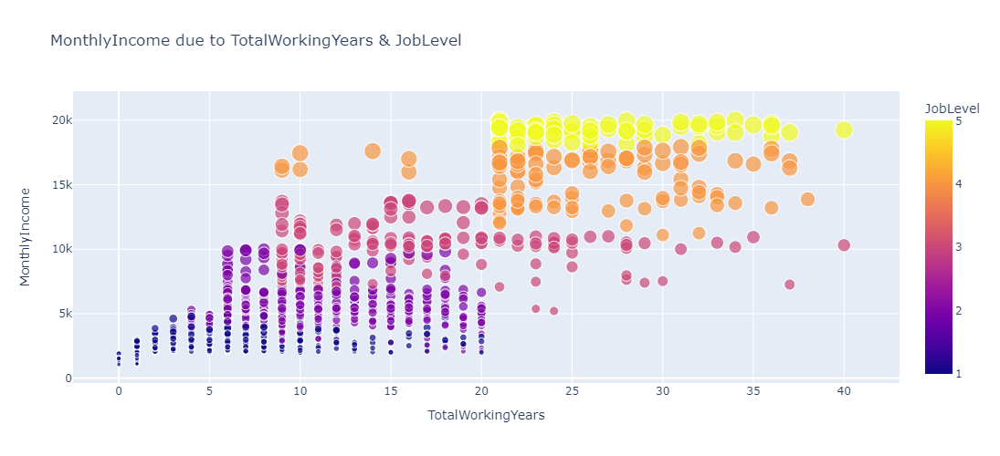

In [124]:
fig = px.scatter(df, x='TotalWorkingYears', y='MonthlyIncome',
                 color='JobLevel', size='MonthlyIncome',
                 title='MonthlyIncome due to TotalWorkingYears & JobLevel', height=500)
fig.show()

With increasing TotalWorkingYears and JobLevel, the MonthlyIncome significantly increase.

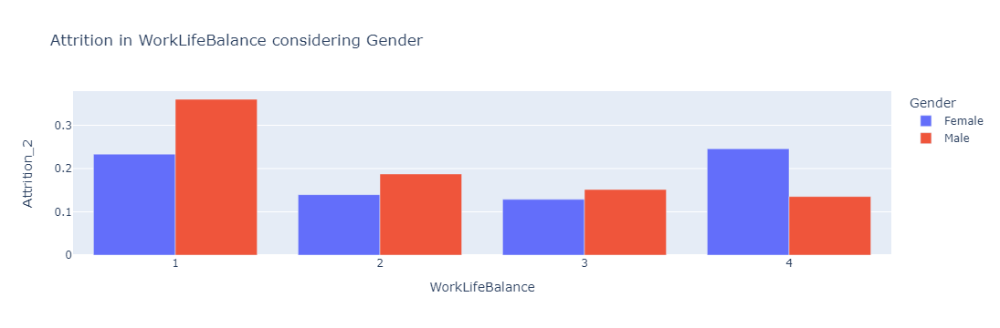

In [126]:
pivot_table = df.pivot_table(values='Attrition_2', index='WorkLifeBalance', columns='Gender')
pivot_table.reset_index(inplace=True)
fig = px.bar(pivot_table,
             x='WorkLifeBalance',
             y=pivot_table.columns[1:],
             title='Attrition in WorkLifeBalance considering Gender',
             labels={'value': 'Attrition_2', 'WorkLifeBalance': 'WorkLifeBalance'},
             barmode='group')
fig.update_layout(legend_title_text='Gender')
fig.show()

While WorkLifeBalance increase, the probability to get attrition decrease and still males are bigger, except for 4. Females are higher probable to get attritioned than males.

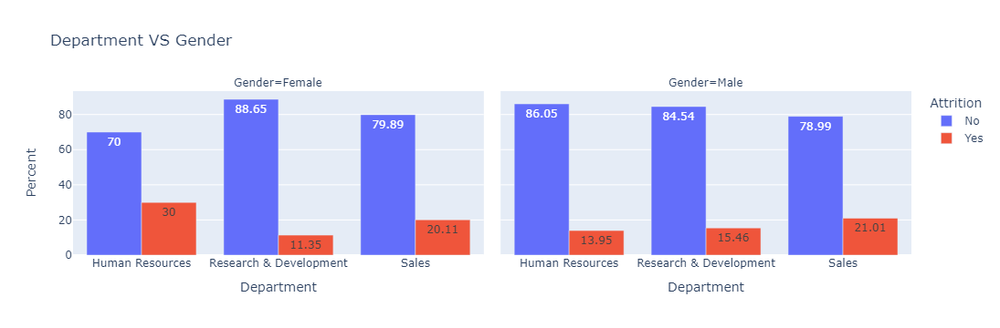

In [128]:
edu_cnt = df.groupby(['Department', 'Gender'])['Attrition'].value_counts(normalize=True)
edu_cnt = edu_cnt.mul(100).rename('Percent').reset_index()
edu_cnt['Percent'] = np.round(edu_cnt['Percent'],2)
fig = px.bar(edu_cnt, x='Department', y='Percent', color='Attrition', facet_col='Gender', title='Department VS Gender',
                   barmode='group', text='Percent')
fig.show()

Females have highest probability of attrition in HR department while males have the highest probability in Sales.\
HR department has distinctly different probability of attrition based on gender.

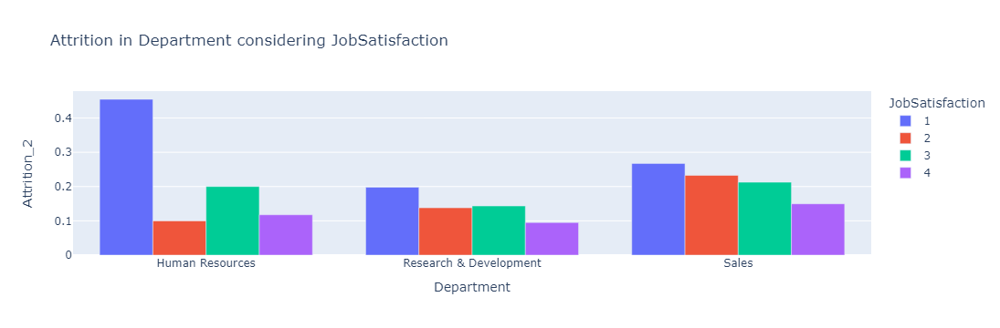

In [130]:
pivot_table = df.pivot_table(values='Attrition_2', index='Department', columns='JobSatisfaction')
pivot_table.reset_index(inplace=True)
fig = px.bar(pivot_table,
             x='Department',
             y=pivot_table.columns[1:],
             title='Attrition in Department considering JobSatisfaction',
             labels={'value': 'Attrition_2', 'Department': 'Department'},
             barmode='group')
fig.update_layout(legend_title_text='JobSatisfaction')
fig.show()

JobSatisfaction 1 in all departments are higher probable to get attritioned. The highest department is HR.

In [132]:
df.drop('Attrition_2', axis=1, inplace=True)

### Final Insights

- Employees working overtime or travelling frequency are more probable to get attritioned.
- Single employees tend to get attritioned.
- WorkLifeBalance, JobInvolvement, and JobSatisfaction directly affect the probability of attrition.
- DistanceFromHome affect the employees' decisions in choosing their jobs.
- The small youth or the old men are more probable to get attrioned, while middle ages seek for stability.
- Monthly income is directly related to TotalWorkingYears and JobLevel.
- HR department has distinctly different probability of attrition based on gender.

-------------------

In [136]:
numeric_col = [col for col in df.columns if df[col].dtype != 'object']
categorical_col = [col for col in df.columns if df[col].dtype == 'object']
print(f"Numeric columns: {numeric_col}")
print(f"Categorical columns: {categorical_col}")

Numeric columns: ['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EmployeeCount', 'EmployeeNumber', 'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']
Categorical columns: ['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'Over18', 'OverTime']


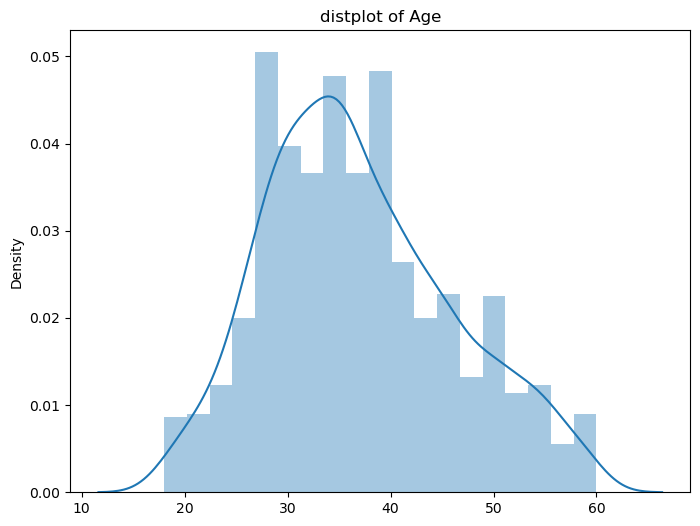

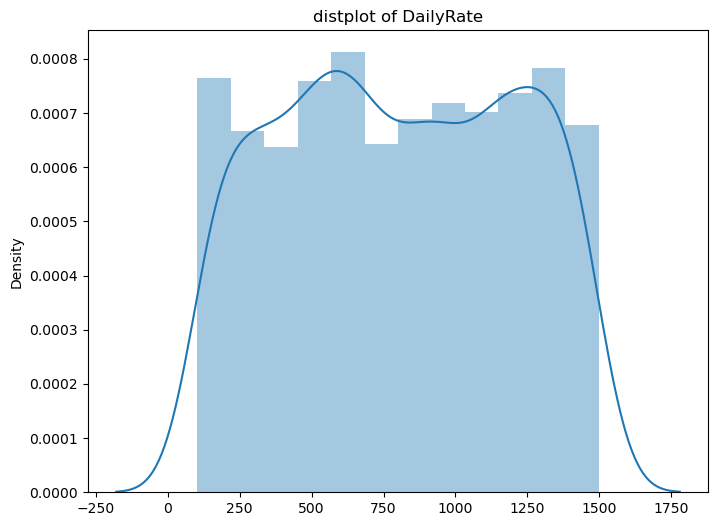

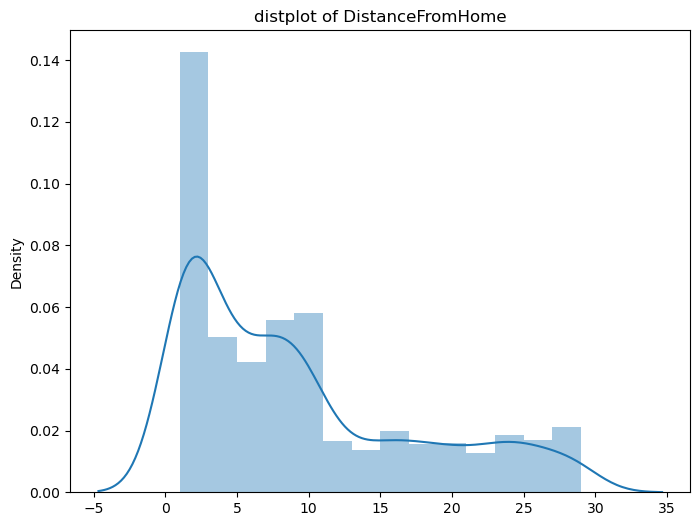

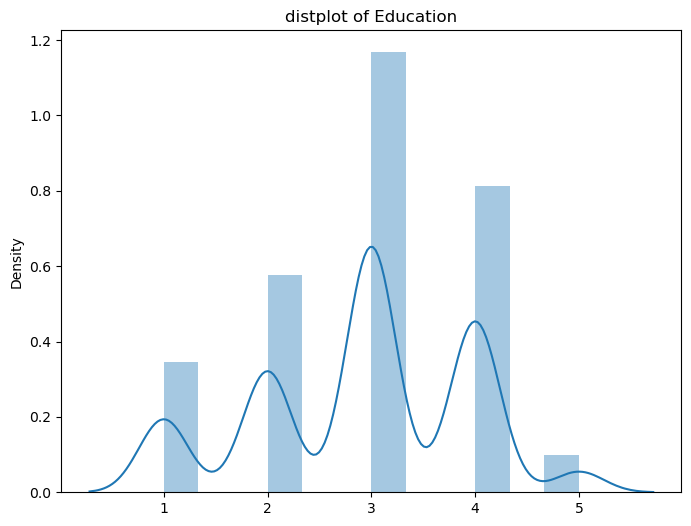

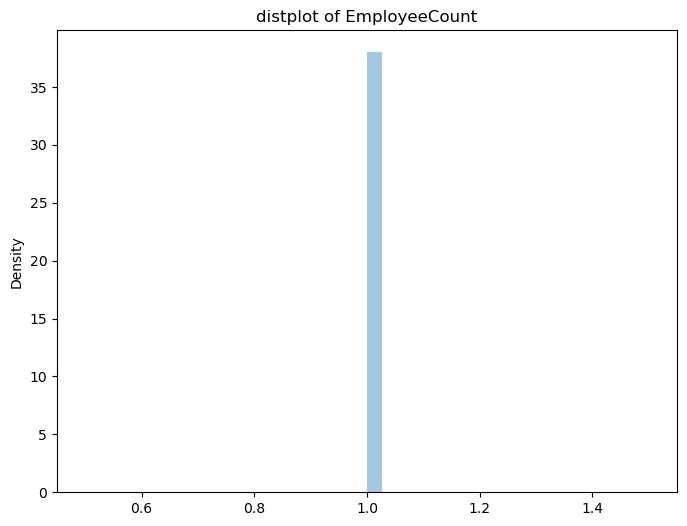

...

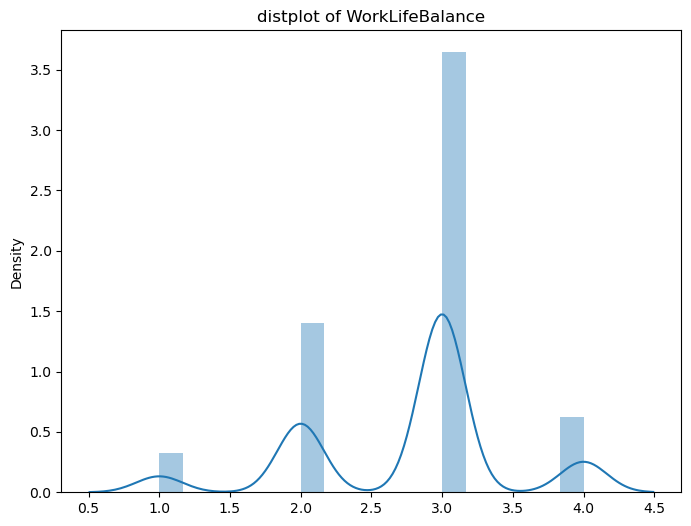

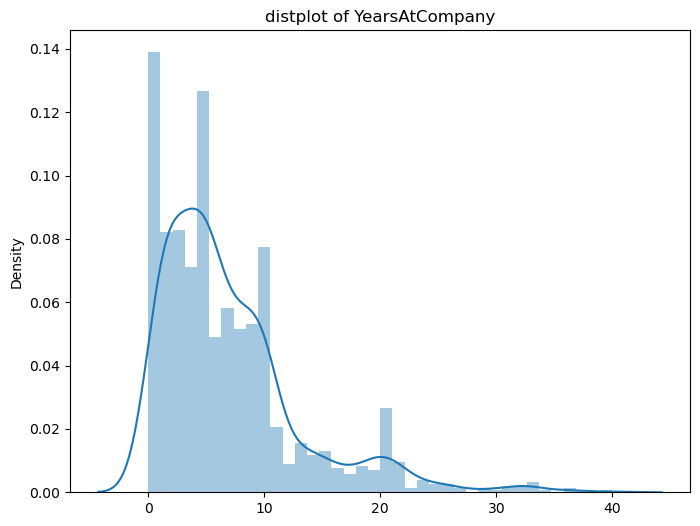

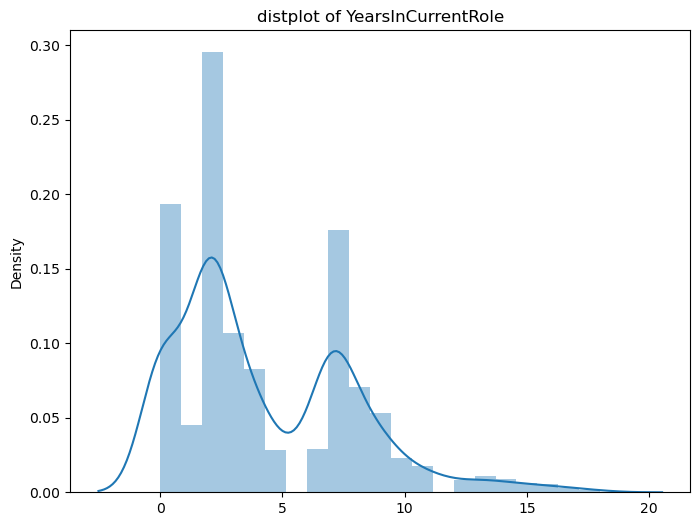

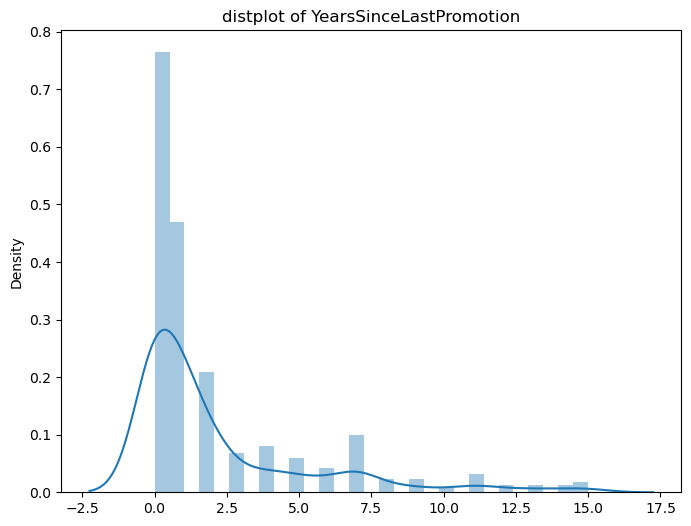

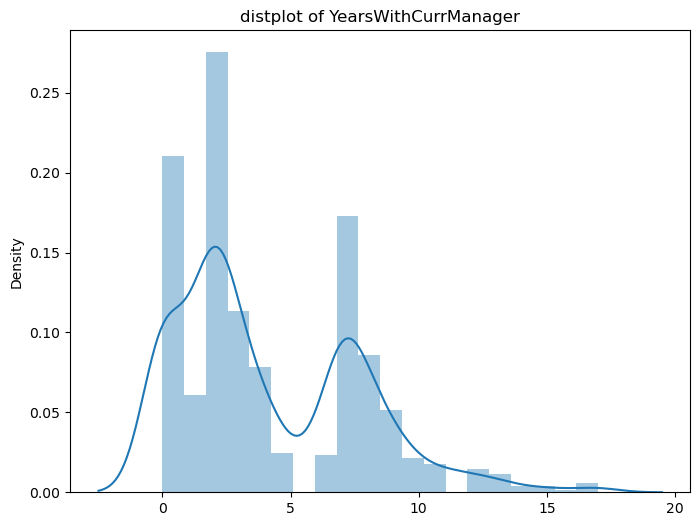

In [137]:
for col in df[numeric_col]:
    plt.figure(figsize=(8, 6))
    sns.distplot(x=df[col])
    plt.title(f'distplot of {col}')
    plt.show()

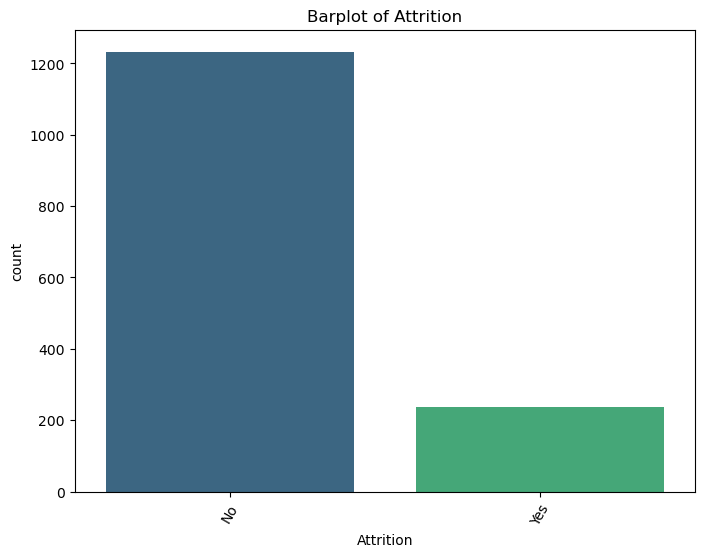

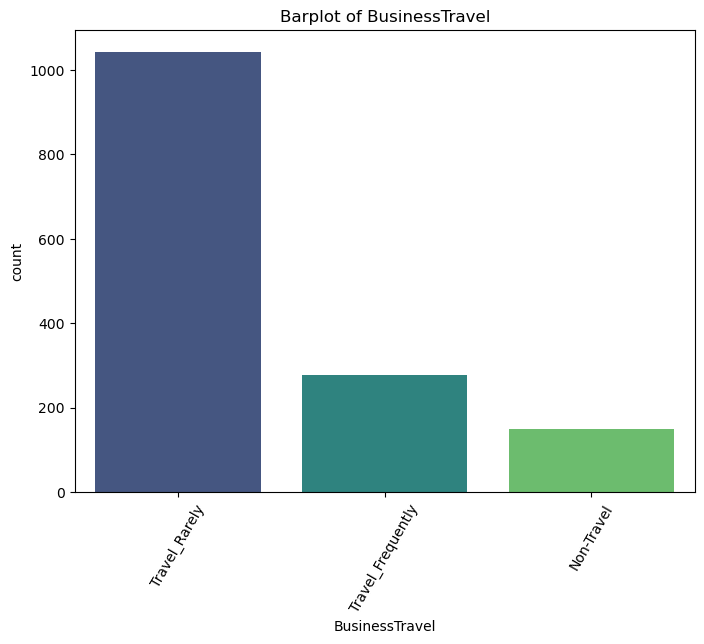

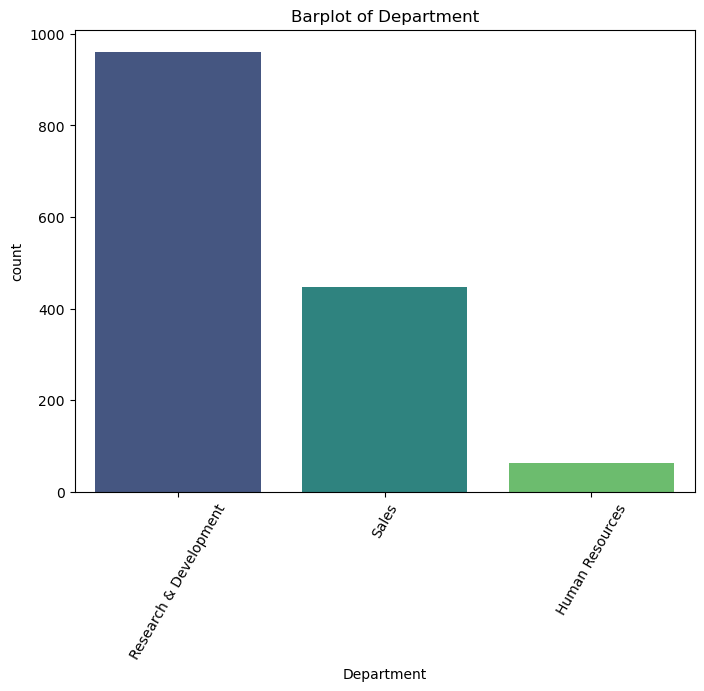

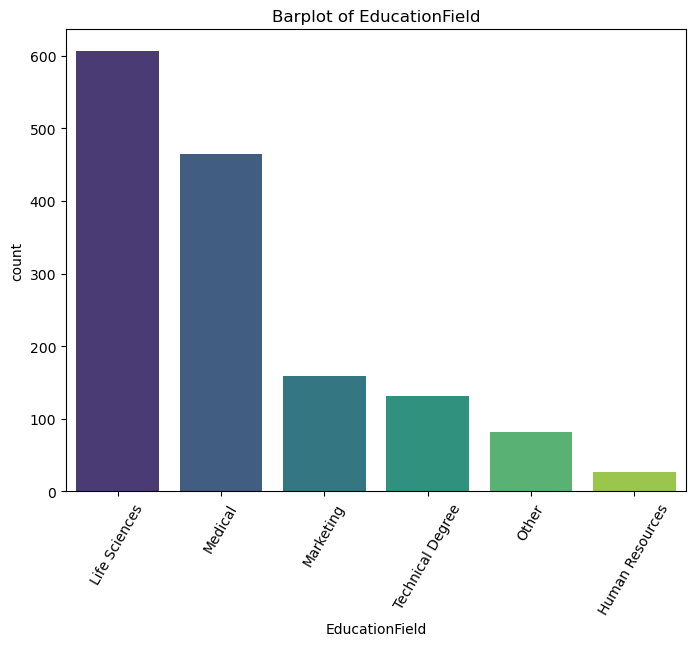

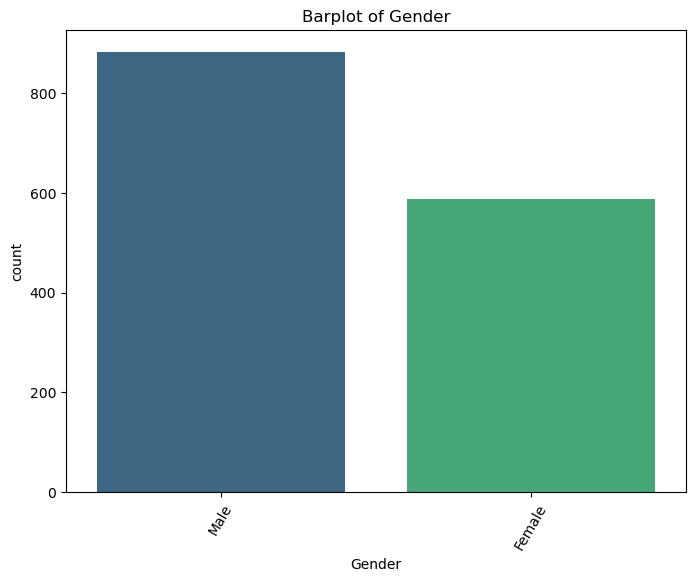

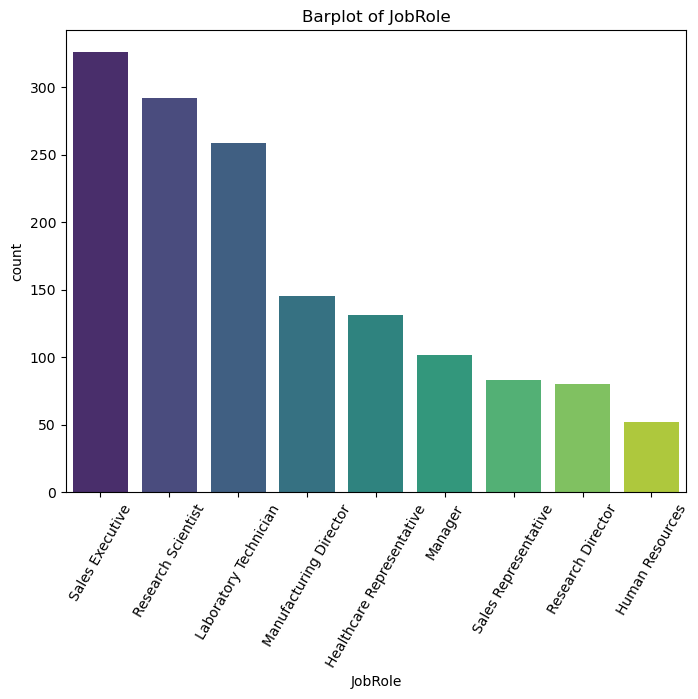

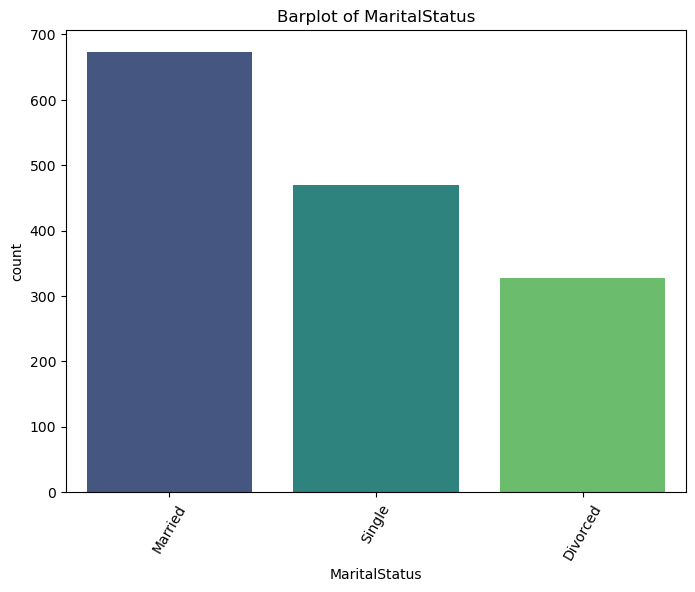

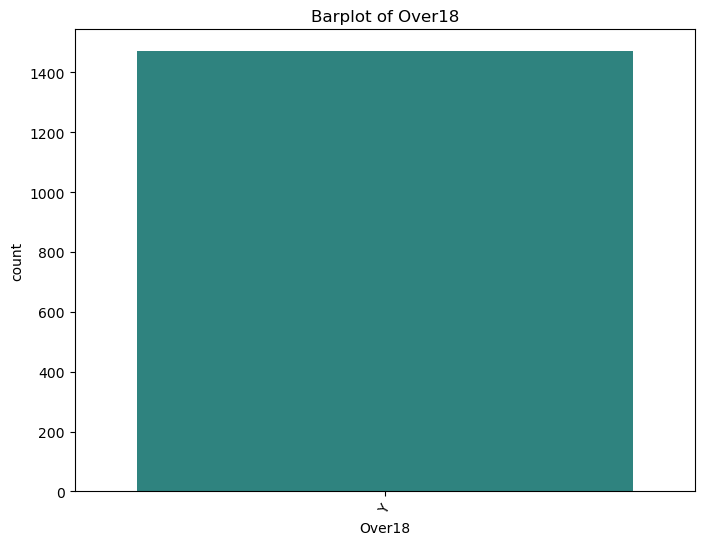

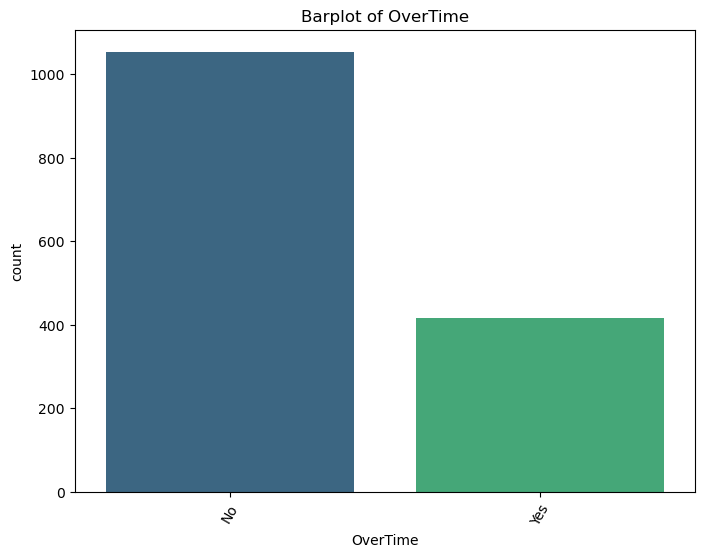

In [138]:
for col in df[categorical_col]:
    plt.figure(figsize=(8, 6))
    sns.countplot(x=df[col], order=df[col].value_counts().index, palette='viridis')
    plt.xticks(rotation=60)
    plt.title(f'Barplot of {col}')
    plt.show()

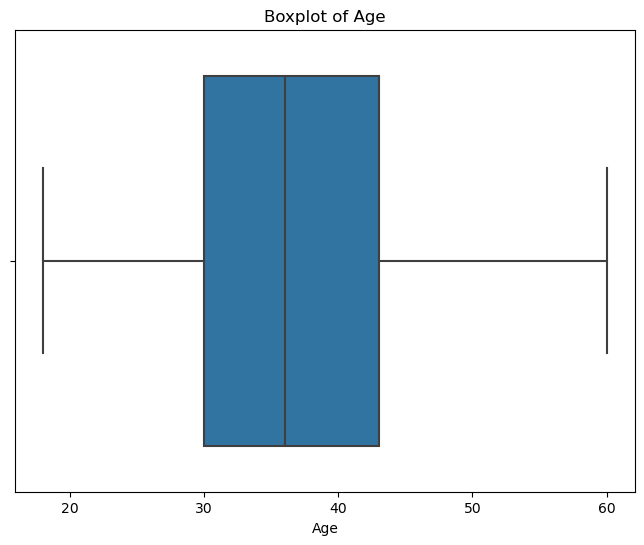

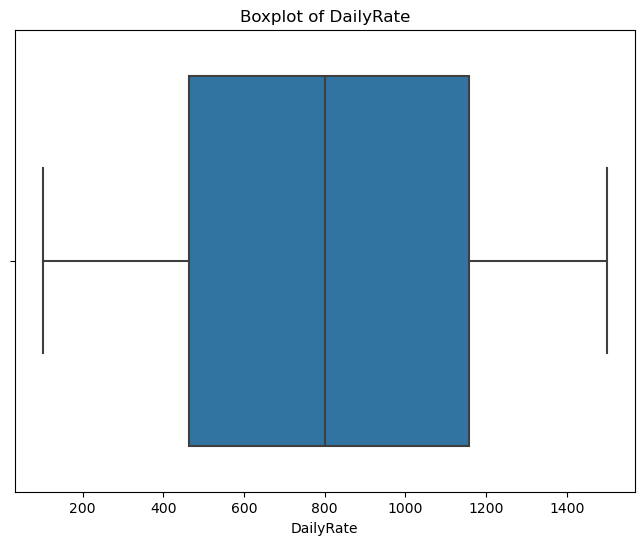

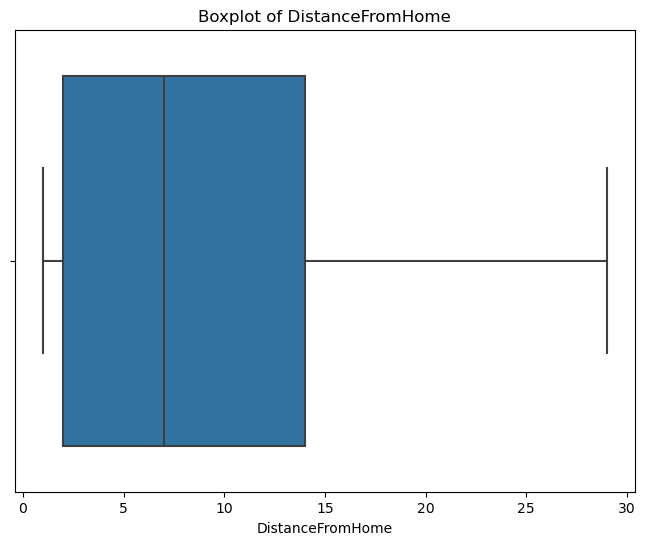

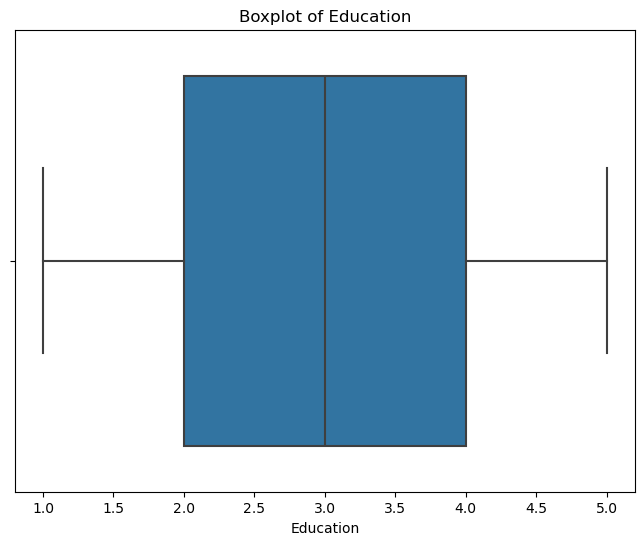

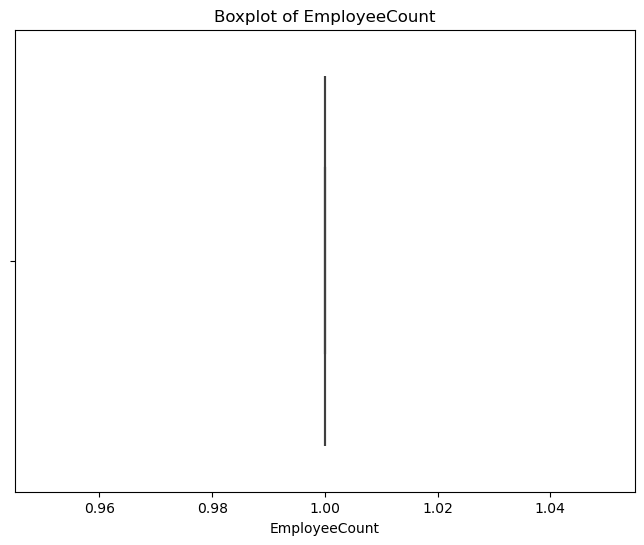

...

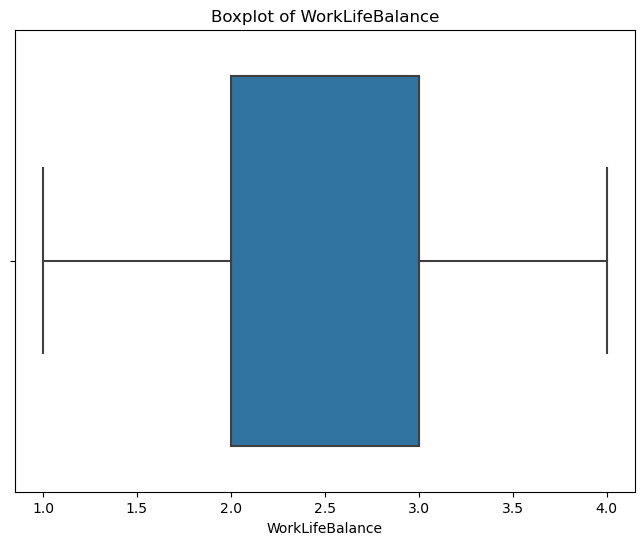

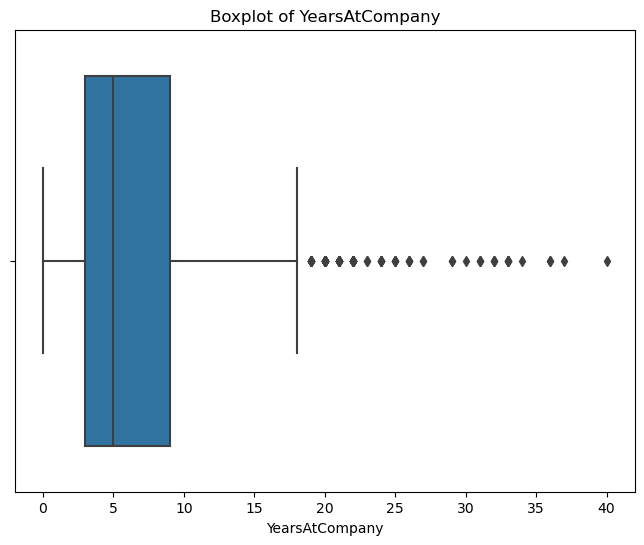

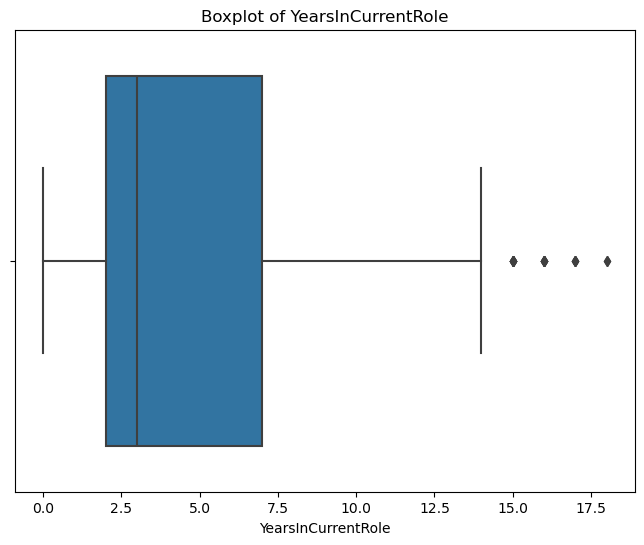

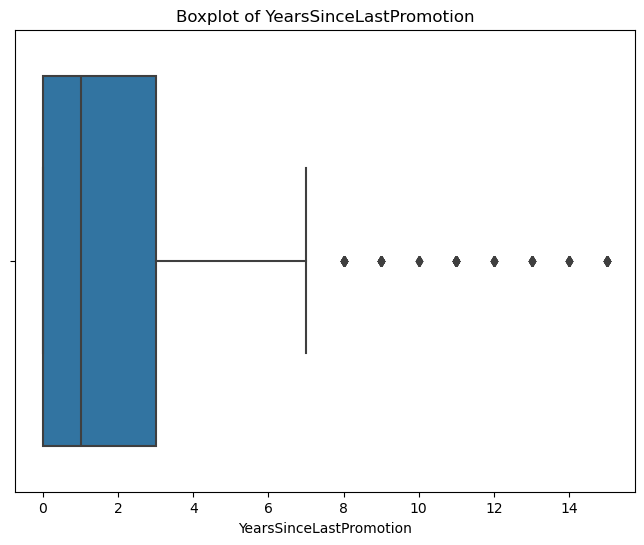

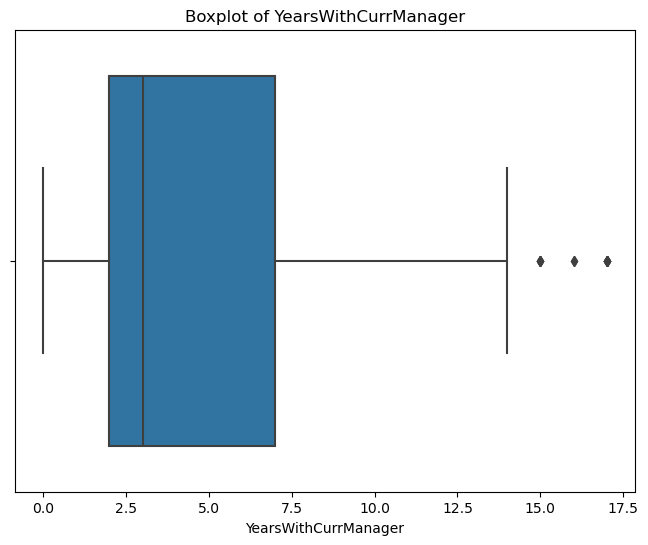

In [139]:
for col in df[numeric_col]:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=df[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

-------------------

# Data Preprocessing

In [142]:
# Map the target to numbers.
df['Attrition'] = df['Attrition'].map({'Yes': 1, 'No': 0})

In [143]:
df.nunique().sort_values(ascending=False)

EmployeeNumber              1470
MonthlyRate                 1427
MonthlyIncome               1349
DailyRate                    886
HourlyRate                    71
Age                           43
TotalWorkingYears             40
YearsAtCompany                37
DistanceFromHome              29
YearsInCurrentRole            19
YearsWithCurrManager          18
YearsSinceLastPromotion       16
PercentSalaryHike             15
NumCompaniesWorked            10
JobRole                        9
TrainingTimesLastYear          7
EducationField                 6
JobLevel                       5
Education                      5
StockOptionLevel               4
JobInvolvement                 4
JobSatisfaction                4
WorkLifeBalance                4
EnvironmentSatisfaction        4
RelationshipSatisfaction       4
BusinessTravel                 3
Department                     3
MaritalStatus                  3
PerformanceRating              2
OverTime                       2
Attrition 

In [144]:
val_cnt = df.nunique()
val_cnt[val_cnt==1]

EmployeeCount    1
Over18           1
StandardHours    1
dtype: int64

Drop these three columns (EmployeeCount, Over18, StandardHours) that have one value all over the data\
Also drop 'EmployeeNumber' column. It's like ID, each employee has distinct number.

In [146]:
df.drop(columns=['EmployeeCount', 'Over18', 'StandardHours', 'EmployeeNumber'], inplace=True)

In [147]:
df.shape

(1470, 31)

In [148]:
df.sample(3)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
908,33,0,Travel_Rarely,536,Sales,10,5,Marketing,4,Male,...,3,4,2,10,3,3,9,8,0,8
103,34,0,Travel_Rarely,665,Research & Development,6,4,Other,1,Female,...,3,3,0,16,3,3,16,13,2,10
1239,31,0,Travel_Frequently,163,Research & Development,24,1,Technical Degree,4,Female,...,4,4,0,9,3,2,5,4,1,4


In [149]:
numerical_cols = df.select_dtypes(include='number').columns
categorical_cols = df.select_dtypes(exclude='number').columns

In [150]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 31 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   int64 
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EnvironmentSatisfaction   1470 non-null   int64 
 9   Gender                    1470 non-null   object
 10  HourlyRate                1470 non-null   int64 
 11  JobInvolvement            1470 non-null   int64 
 12  JobLevel                  1470 non-null   int64 
 13  JobRole                   1470 non-null   object
 14  JobSatisfaction         

## Analyzing features relations

In [152]:
corr_matrix = df[numerical_cols].corr()
corr_matrix

,Age,Attrition,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.159205,0.010661,-0.001686,0.208034,0.010146,0.024287,0.029820,0.509604,-0.004892,...,0.001904,0.053535,0.037510,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089
Attrition,-0.159205,1.000000,-0.056652,0.077924,-0.031373,-0.103369,-0.006846,-0.130016,-0.169105,-0.103481,...,0.002889,-0.045872,-0.137145,-0.171063,-0.059478,-0.063939,-0.134392,-0.160545,-0.033019,-0.156199
DailyRate,0.010661,-0.056652,1.000000,-0.004985,-0.016806,0.018355,0.023381,0.046135,0.002966,0.030571,...,0.000473,0.007846,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363
DistanceFromHome,-0.001686,0.077924,-0.004985,1.000000,0.021042,-0.016075,0.031131,0.008783,0.005303,-0.003669,...,0.027110,0.006557,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406
Education,0.208034,-0.031373,-0.016806,0.021042,1.000000,-0.027128,0.016775,0.042438,0.101589,-0.011296,...,-0.024539,-0.009118,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065
EnvironmentSatisfaction,0.010146,-0.103369,0.018355,-0.016075,-0.027128,1.000000,-0.049857,-0.008278,0.001212,-0.006784,...,-0.029548,0.007665,0.003432,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999
HourlyRate,0.024287,-0.006846,0.023381,0.031131,0.016775,-0.049857,1.000000,0.042861,-0.027853,-0.071335,...,-0.002172,0.001330,0.050263,-0.002334,-0.008548,-0.004607,-0.019582,-0.024106,-0.026716,-0.020123
JobInvolvement,0.029820,-0.130016,0.046135,0.008783,0.042438,-0.008278,0.042861,1.000000,-0.012630,-0.021476,...,-0.029071,0.034297,0.021523,-0.005533,-0.015338,-0.014617,-0.021355,0.008717,-0.024184,0.025976
JobLevel,0.509604,-0.169105,0.002966,0.005303,0.101589,0.001212,-0.027853,-0.012630,1.000000,-0.001944,...,-0.021222,0.021642,0.013984,0.782208,-0.018191,0.037818,0.534739,0.389447,0.353885,0.375281
JobSatisfaction,-0.004892,-0.103481,0.030571,-0.003669,-0.011296,-0.006784,-0.071335,-0.021476,-0.001944,1.000000,...,0.002297,-0.012454,0.010690,-0.020185,-0.005779,-0.019459,-0.003803,-0.002305,-0.018214,-0.027656


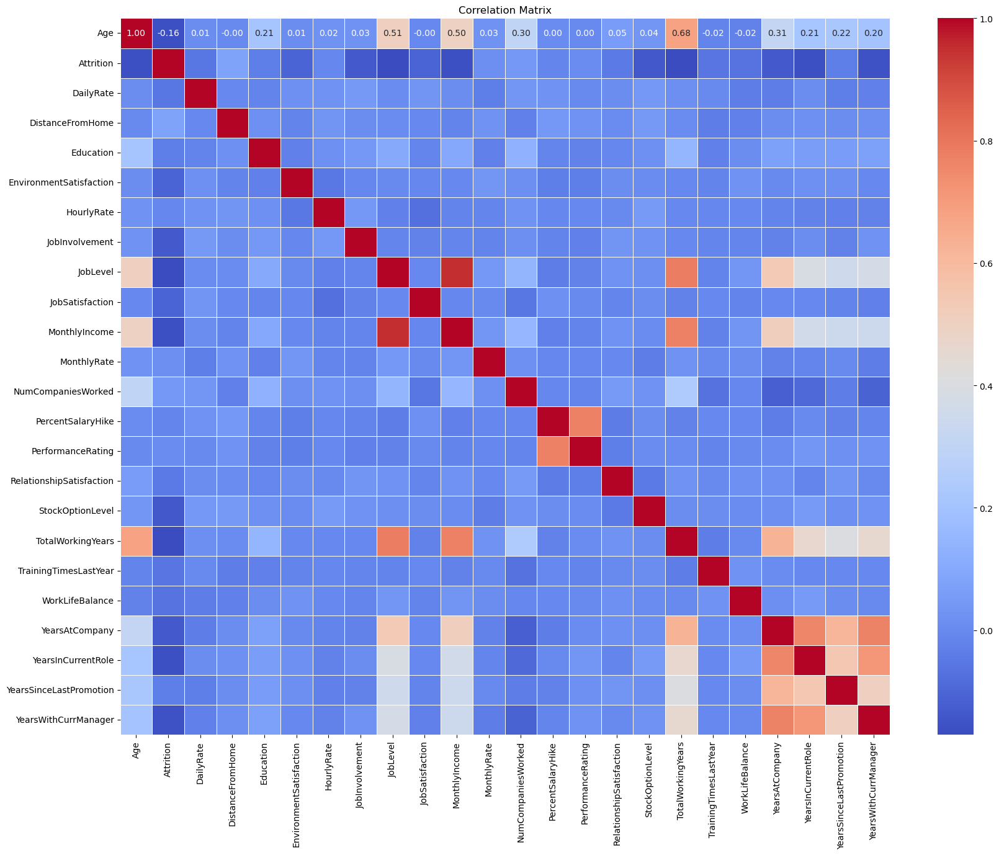

In [153]:
corr_matrix = df[numerical_cols].corr()
plt.figure(figsize=(20, 15))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

## View the number of outliers in the columns

In [155]:
# Function to detect outliers in a column
def detect_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers


# Detect outliers in each numerical column and store results
outliers_info = {}

for col in df.select_dtypes(include="number").columns:
    outliers = detect_outliers(df, col)
    if not outliers.empty:
        outliers_info[col] = len(outliers)
        #print(f"Column '{col}' has {len(outliers)} outliers.")


if outliers_info:
    print("\nColumns with detected outliers:")
    for col, count in outliers_info.items():
        print(f"{col}: {count} outliers")
else:
    print("No outliers detected in the numerical columns.")


Columns with detected outliers:
Attrition: 237 outliers
MonthlyIncome: 114 outliers
NumCompaniesWorked: 52 outliers
PerformanceRating: 226 outliers
StockOptionLevel: 85 outliers
TotalWorkingYears: 63 outliers
TrainingTimesLastYear: 238 outliers
YearsAtCompany: 104 outliers
YearsInCurrentRole: 21 outliers
YearsSinceLastPromotion: 107 outliers
YearsWithCurrManager: 14 outliers


In [156]:
import random

def xicor(X, Y, ties=True):
    random.seed(42)
    n = len(X)
    order = np.argsort(X)
    sorted_Y = np.array(Y)[order]

    if ties:
        ranks = np.argsort(np.argsort(sorted_Y)) + 1
        l = np.array([np.sum(ranks >= rank) for rank in ranks])
        r = l.copy()

        for j in range(n):
            if np.sum(r == r[j]) > 1:
                tie_indices = np.where(r == r[j])[0]
                random_adjustments = np.random.choice(
                    np.arange(len(tie_indices)),
                    size=len(tie_indices),
                    replace=False
                )
                r[tie_indices] = r[tie_indices] - random_adjustments

        return 1 - n * np.sum(np.abs(r[1:] - r[:-1])) / (2 * np.sum(l * (n - l)))

    else:
        ranks = np.argsort(np.argsort(sorted_Y)) + 1
        return 1 - 3 * np.sum(np.abs(ranks[1:] - ranks[:-1])) / (n**2 - 1)

In [157]:
xi_corr_matrix = pd.DataFrame(index=numerical_cols, columns=numerical_cols)
for i in range(len(numerical_cols)):
    for j in range(i, len(numerical_cols)):
        col1 = numerical_cols[i]
        col2 = numerical_cols[j]
        try:
            correlation = xicor(df[col1].dropna(), df[col2].dropna())
            xi_corr_matrix.loc[col1, col2] = correlation
            xi_corr_matrix.loc[col2, col1] = correlation  # Symmetric matrix
        except Exception as e:
            xi_corr_matrix.loc[col1, col2] = f'Error: {e}'
            xi_corr_matrix.loc[col2, col1] = f'Error: {e}'
xi_corr_matrix = xi_corr_matrix.apply(pd.to_numeric, errors='coerce')

In [158]:
xi_corr_matrix

,Age,Attrition,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,0.989736,0.635402,0.014898,-0.019746,0.140617,0.057395,-0.049227,0.235274,0.174521,0.038032,...,0.579935,0.093298,0.144270,0.318838,0.074814,0.218496,0.087966,0.082315,0.114809,0.058327
Attrition,0.635402,0.982198,-0.000931,0.018157,0.075228,0.054248,0.036228,0.258049,0.090206,0.100617,...,0.580400,0.062422,0.162576,0.015264,0.064731,0.226198,0.048632,0.054332,0.081034,0.049465
DailyRate,0.014898,-0.000931,0.997516,0.022167,0.063140,0.061423,-0.000310,0.208153,0.079362,0.051402,...,0.595885,0.050299,0.119346,0.006383,0.095358,0.245949,0.034714,0.044131,0.077020,0.071131
DistanceFromHome,-0.019746,0.018157,0.022167,0.988217,0.077122,0.077234,0.021235,0.229660,0.105215,0.097198,...,0.557345,0.036407,0.143336,0.038486,0.072837,0.252646,0.022022,0.047131,0.073674,0.055125
Education,0.140617,0.075228,0.063140,0.077122,0.983156,0.053329,-0.002112,0.209217,0.108660,0.055699,...,0.602842,0.054706,0.151414,0.039504,0.088867,0.228013,0.018092,0.022562,0.049017,0.028760
EnvironmentSatisfaction,0.057395,0.054248,0.061423,0.077234,0.053329,0.982825,0.013497,0.225774,0.086623,0.103386,...,0.586873,0.070948,0.130649,-0.003732,0.055767,0.217145,0.022399,0.031874,0.089439,0.008034
HourlyRate,-0.049227,0.036228,-0.000310,0.021235,-0.002112,0.013497,0.991088,0.200098,0.093933,0.071958,...,0.570511,0.069090,0.125293,-0.013044,0.069652,0.241993,0.027506,0.019944,0.063054,0.027692
JobInvolvement,0.235274,0.258049,0.208153,0.229660,0.209217,0.225774,0.200098,0.982014,0.135858,0.048098,...,0.591812,0.076172,0.132996,0.040627,0.066129,0.248842,0.042579,0.056071,0.075911,0.060434
JobLevel,0.174521,0.090206,0.079362,0.105215,0.108660,0.086623,0.093933,0.135858,0.982975,0.044233,...,0.586653,0.071453,0.128896,0.365339,0.066787,0.212948,0.126161,0.074959,0.104918,0.084528
JobSatisfaction,0.038032,0.100617,0.051402,0.097198,0.055699,0.103386,0.071958,0.048098,0.044233,0.983186,...,0.613222,0.037294,0.127269,0.008384,0.063969,0.249841,0.005046,0.031300,0.051953,0.035047


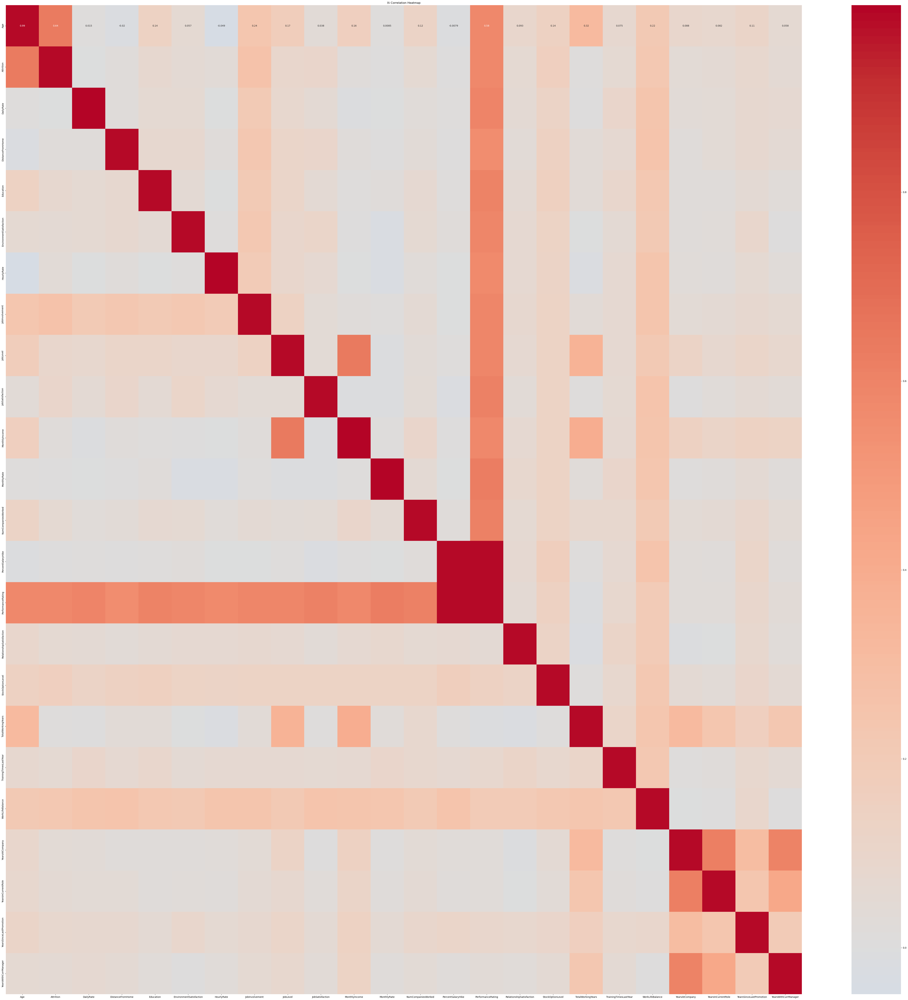

In [159]:
plt.figure(figsize=(75, 75))
sns.heatmap(xi_corr_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Xi Correlation Heatmap')
plt.show()

In [160]:
threshold = 0.4
cols_to_consider = set()
for i in range(len(xi_corr_matrix.columns)):
    for j in range(i):
        if abs(xi_corr_matrix.iloc[i, j]) >= threshold:
            colname = xi_corr_matrix.columns[i]
            cols_to_consider.add(colname)

print(f"Columns to consider: {cols_to_consider}")

Columns to consider: {'Attrition', 'YearsWithCurrManager', 'YearsInCurrentRole', 'MonthlyIncome', 'PerformanceRating'}


In [161]:
corr_matrix = df[numerical_cols].corr()
corr_matrix

,Age,Attrition,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.159205,0.010661,-0.001686,0.208034,0.010146,0.024287,0.029820,0.509604,-0.004892,...,0.001904,0.053535,0.037510,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089
Attrition,-0.159205,1.000000,-0.056652,0.077924,-0.031373,-0.103369,-0.006846,-0.130016,-0.169105,-0.103481,...,0.002889,-0.045872,-0.137145,-0.171063,-0.059478,-0.063939,-0.134392,-0.160545,-0.033019,-0.156199
DailyRate,0.010661,-0.056652,1.000000,-0.004985,-0.016806,0.018355,0.023381,0.046135,0.002966,0.030571,...,0.000473,0.007846,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363
DistanceFromHome,-0.001686,0.077924,-0.004985,1.000000,0.021042,-0.016075,0.031131,0.008783,0.005303,-0.003669,...,0.027110,0.006557,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406
Education,0.208034,-0.031373,-0.016806,0.021042,1.000000,-0.027128,0.016775,0.042438,0.101589,-0.011296,...,-0.024539,-0.009118,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065
EnvironmentSatisfaction,0.010146,-0.103369,0.018355,-0.016075,-0.027128,1.000000,-0.049857,-0.008278,0.001212,-0.006784,...,-0.029548,0.007665,0.003432,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999
HourlyRate,0.024287,-0.006846,0.023381,0.031131,0.016775,-0.049857,1.000000,0.042861,-0.027853,-0.071335,...,-0.002172,0.001330,0.050263,-0.002334,-0.008548,-0.004607,-0.019582,-0.024106,-0.026716,-0.020123
JobInvolvement,0.029820,-0.130016,0.046135,0.008783,0.042438,-0.008278,0.042861,1.000000,-0.012630,-0.021476,...,-0.029071,0.034297,0.021523,-0.005533,-0.015338,-0.014617,-0.021355,0.008717,-0.024184,0.025976
JobLevel,0.509604,-0.169105,0.002966,0.005303,0.101589,0.001212,-0.027853,-0.012630,1.000000,-0.001944,...,-0.021222,0.021642,0.013984,0.782208,-0.018191,0.037818,0.534739,0.389447,0.353885,0.375281
JobSatisfaction,-0.004892,-0.103481,0.030571,-0.003669,-0.011296,-0.006784,-0.071335,-0.021476,-0.001944,1.000000,...,0.002297,-0.012454,0.010690,-0.020185,-0.005779,-0.019459,-0.003803,-0.002305,-0.018214,-0.027656


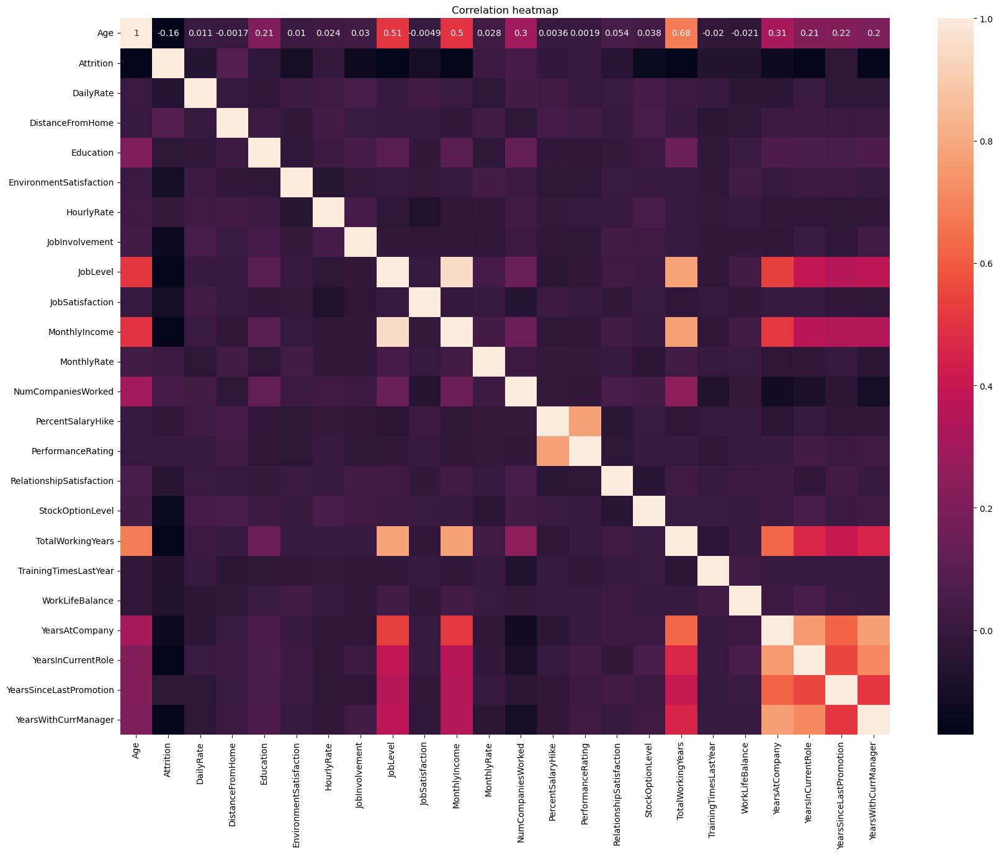

In [162]:
plt.figure(figsize=(20,15))
sns.heatmap(df[numerical_cols].corr(), annot=True)
plt.title('Correlation heatmap')
plt.show()

In [163]:
threshold = 0.4
cols_to_consider = set()
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) >= threshold:
            colname = corr_matrix.columns[i]
            cols_to_consider.add(colname)

print(f"Columns to consider: {cols_to_consider}")

Columns to consider: {'YearsAtCompany', 'YearsWithCurrManager', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'TotalWorkingYears', 'JobLevel', 'MonthlyIncome', 'PerformanceRating'}


In [164]:
# Drop columns with low corr with the Target
df.drop(columns = ["PerformanceRating",'HourlyRate'], inplace=True)

##  Handle the  Multicollinearity

In [166]:
numeric_col = df.select_dtypes(include=np.number).columns

In [167]:
def compute_vif(considered_features):

    x = df[considered_features]
    # the calculation of variance inflation requires a constant
    x['intercept'] = 1
    # create dataframe to store vif values
    vif = pd.DataFrame()
    vif["Variable"] = x.columns
    vif["VIF"] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
    vif = vif[vif['Variable']!='intercept']
    return vif
vif_data = compute_vif(numeric_col)
print(vif_data)

                    Variable        VIF
0                        Age   2.053047
1                  Attrition   1.158965
2                  DailyRate   1.018671
3           DistanceFromHome   1.022710
4                  Education   1.058480
5    EnvironmentSatisfaction   1.020051
6             JobInvolvement   1.031313
7                   JobLevel  11.187522
8            JobSatisfaction   1.021439
9              MonthlyIncome  10.787575
10               MonthlyRate   1.012279
11        NumCompaniesWorked   1.268545
12         PercentSalaryHike   1.011103
13  RelationshipSatisfaction   1.018831
14          StockOptionLevel   1.034370
15         TotalWorkingYears   4.764334
16     TrainingTimesLastYear   1.013465
17           WorkLifeBalance   1.018402
18            YearsAtCompany   4.597416
19        YearsInCurrentRole   2.730153
20   YearsSinceLastPromotion   1.684818
21      YearsWithCurrManager   2.789682


#  Feature Selection & Feature Engineering

In [169]:
df['Score'] = 0.68*df['TotalWorkingYears'] + 0.78*df['JobLevel']+ 0.77*df['MonthlyIncome']+ 0.63*df['YearsAtCompany']
df['WeightedYear'] = 0.77*df['YearsAtCompany'] + 0.55*df['YearsInCurrentRole'] + 0.62*df['YearsSinceLastPromotion'] + 0.71*df['YearsWithCurrManager']

In [170]:
# Calculate the IncomeRatio.
df['IncomeRateRatio'] = df['MonthlyIncome'] / df['MonthlyRate']

In [171]:
# Categories the Age.
bins = [18, 25, 35, 45, 55, 65]
labels = ['Young Adult', 'Adult', 'Middle-Aged', 'Mature Adult', 'Senior']
df['AgeGroup'] = pd.cut(df['Age'], bins=bins, labels=labels, right=False)

In [172]:
# Categories the DistanceFromHome.
bins = [0,5,10,15,20,30]
labels = ['Very Near', 'Near', 'Moderate', 'Far', 'Very Far']
df['DistanceGroup'] = pd.cut(df['DistanceFromHome'], bins=bins, labels=labels)

In [173]:
# Combine all the satisfaction columns in OverAllSatisfaction.
df['OverAllSatisfaction'] = (df['RelationshipSatisfaction']  + df['EnvironmentSatisfaction'] + df['JobSatisfaction'] + df['JobInvolvement'] + df['WorkLifeBalance'])/5

In [174]:
df.drop(columns = ['PercentSalaryHike','WorkLifeBalance','YearsAtCompany'],inplace = True)
#df.drop(columns=['TotalWorkingYears', 'MonthlyIncome', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager', 'JobLevel'], inplace=True)

In [175]:
numeric_col = df.select_dtypes(include=np.number).columns
def compute_vif(considered_features):

    x = df[considered_features]
    # the calculation of variance inflation requires a constant
    x['intercept'] = 1
    # create dataframe to store vif values
    vif = pd.DataFrame()
    vif["Variable"] = x.columns
    vif["VIF"] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
    vif = vif[vif['Variable']!='intercept']
    return vif
vif_data = compute_vif(numeric_col)
print(vif_data)

                    Variable       VIF
0                        Age  2.051850
1                  Attrition  1.158477
2                  DailyRate  1.019077
3           DistanceFromHome  1.021561
4                  Education  1.058317
5    EnvironmentSatisfaction  3.521234
6             JobInvolvement  2.022435
7                   JobLevel       inf
8            JobSatisfaction  3.419953
9              MonthlyIncome       inf
10               MonthlyRate  1.760657
11        NumCompaniesWorked  1.268631
12  RelationshipSatisfaction  3.474885
13          StockOptionLevel  1.035166
14         TotalWorkingYears       inf
15     TrainingTimesLastYear  1.014894
16        YearsInCurrentRole       inf
17   YearsSinceLastPromotion       inf
18      YearsWithCurrManager       inf
19                     Score       inf
20              WeightedYear       inf
21           IncomeRateRatio  2.670163
22       OverAllSatisfaction  9.395716


# Modeling

## Encoding

In [178]:
df_label = df.copy()
df_OHE = df.copy()
df_binary = df.copy()

In [179]:
categorical_cols = df.select_dtypes(exclude='number').columns
categorical_cols

Index(['BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole',
       'MaritalStatus', 'OverTime', 'AgeGroup', 'DistanceGroup'],
      dtype='object')

In [180]:
# label encoding
for col in categorical_cols:
    le = LabelEncoder()
    df_label[col] = le.fit_transform(df_label[col])

In [181]:
# one hot encoding
df_OHE = pd.get_dummies(df_OHE ,columns=categorical_cols).astype('int64')

In [182]:
# binary encoding
encoder = BinaryEncoder(cols=categorical_cols, return_df=True)
df_binary = encoder.fit_transform(df)

In [183]:
# Map the gender to 0 or 1.
df["Gender"] = df["Gender"].replace({"Female":0 ,"Male":1})

In [184]:
# Use the get_dummies for the nominal columns.
df = pd.get_dummies(df, columns=['BusinessTravel', 'Department', 'EducationField', 'JobRole', 'MaritalStatus', 'OverTime'], drop_first=True)

In [185]:
# Label Encoding
def encode(df):
    for col in df.columns:
        if df[col].dtype == 'object' or df[col].dtype.name == 'category':
            le = LabelEncoder()
            df[col] = le.fit_transform(df[col])
    return df

In [186]:
# Use the Label encoding for the rest of the categorical columns
df = encode(df)

In [187]:
#df = df_label.copy()
#df = df_OHE.copy()
#df = df_binary.copy()

In [188]:
df.head()

,Age,Attrition,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,Gender,JobInvolvement,JobLevel,JobSatisfaction,...,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
0,41,1,1102,1,2,2,0,3,2,4,...,False,False,False,False,False,True,False,False,True,True
1,49,0,279,8,1,3,1,2,2,2,...,False,False,False,False,True,False,False,True,False,False
2,37,1,1373,2,2,4,1,2,1,3,...,True,False,False,False,False,False,False,False,True,True
3,33,0,1392,3,4,4,0,3,1,3,...,False,False,False,False,True,False,False,True,False,True
4,27,0,591,2,1,1,1,3,1,2,...,True,False,False,False,False,False,False,True,False,False


In [189]:
X = df.drop(columns=['Attrition'])
y = df['Attrition']

In [190]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state= 42, stratify=y)

print("X_train shape:",X_train.shape)
print("X_test shape:",X_test.shape)
print("y_train shape:",y_train.shape)
print("y_test shape:",y_test.shape)

X_train shape: (1176, 45)
X_test shape: (294, 45)
y_train shape: (1176,)
y_test shape: (294,)


In [191]:
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

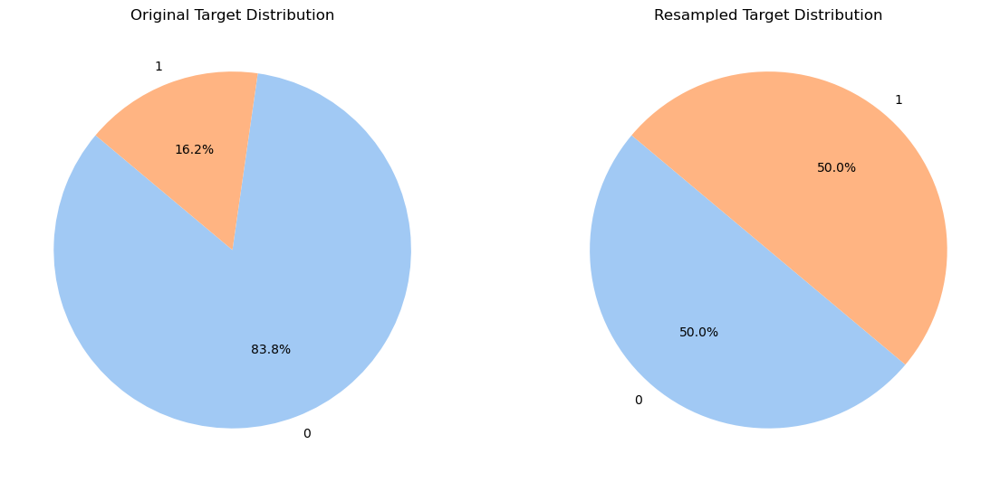

In [192]:
original_dist = y_train.value_counts(normalize=True)
resampled_dist = y_train_resampled.value_counts(normalize=True)

fig, ax = plt.subplots(1, 2, figsize=(14, 7))

# Original Distribution Pie Chart
ax[0].pie(original_dist, labels=original_dist.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('pastel'))
ax[0].set_title('Original Target Distribution')

# Resampled Distribution Pie Chart
ax[1].pie(resampled_dist, labels=resampled_dist.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('pastel'))
ax[1].set_title('Resampled Target Distribution')

plt.show()

## Different Scaling Techniques

In [194]:
stander_scaler = StandardScaler()
MinMax_scaler = MinMaxScaler()
Robust_scaling = RobustScaler()

## Different Scaling Techniques

In [196]:
Knn_model = KNeighborsClassifier(metric='manhattan', n_neighbors=6 ,weights='uniform')
logistic_model = LogisticRegression(C=0.1,solver='liblinear')
Svc_model = SVC(C=0.1, kernel='linear')
Naive_model = GaussianNB()
dt_model = DecisionTreeClassifier(random_state=42, criterion = 'gini', max_depth=3, min_samples_split=2, min_samples_leaf=1)
rf_model = RandomForestClassifier(random_state=42, max_depth=8,min_samples_leaf=1,min_samples_split=4,n_estimators=50)

## Before the OverSampling

In [198]:
from sklearn.metrics import classification_report

In [199]:
models = {
    'SVM': Svc_model,
    'Logistic Regression': logistic_model,
    'KNN': Knn_model,
    'GaussianNB': Naive_model,
    'Decision Tree': dt_model,
    'Random Forest': rf_model
}

# Initialize dictionaries to store accuracies
train_accuracies = {}
test_accuracies = {}

# Define the scalers
scalers = {
    'StandardScaler': stander_scaler,
    'MinMaxScaler': MinMax_scaler,
    'RobustScaler': Robust_scaling
}

# Iterate over each scaler
for scaler_name, scaler in scalers.items():
    # Scale the features using the current scaler
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Iterate over each model
    for model_name, model in models.items():
        model.fit(X_train_scaled, y_train)

        train_predictions = model.predict(X_train_scaled)
        test_predictions = model.predict(X_test_scaled)

        train_accuracy = accuracy_score(y_train, train_predictions)
        test_accuracy = accuracy_score(y_test, test_predictions)

        # Store the results using a combination of scaler and model names
        train_accuracies[f'{model_name} ({scaler_name})'] = train_accuracy
        test_accuracies[f'{model_name} ({scaler_name})'] = test_accuracy
        
        print(model_name, scaler_name)
        print(classification_report(y_train, train_predictions))
        print(classification_report(y_test, test_predictions))
        print('-'*50)

# Create a DataFrame to display the results
results_df = pd.DataFrame({
    'Model & Scaler': list(train_accuracies.keys()),
    'Train Accuracy': list(train_accuracies.values()),
    'Test Accuracy': list(test_accuracies.values())
})
results_df = results_df.sort_values(by='Test Accuracy', ascending=False)
results_df

SVM StandardScaler
              precision    recall  f1-score   support

           0       0.90      0.98      0.94       986
           1       0.85      0.46      0.60       190

    accuracy                           0.90      1176
   macro avg       0.88      0.72      0.77      1176
weighted avg       0.90      0.90      0.89      1176

              precision    recall  f1-score   support

           0       0.89      0.97      0.93       247
           1       0.71      0.36      0.48        47

    accuracy                           0.87       294
   macro avg       0.80      0.67      0.70       294
weighted avg       0.86      0.87      0.86       294

--------------------------------------------------
Logistic Regression StandardScaler
              precision    recall  f1-score   support

           0       0.90      0.98      0.94       986
           1       0.84      0.46      0.60       190

    accuracy                           0.90      1176
   macro avg       0.87

,Model & Scaler,Train Accuracy,Test Accuracy
13,Logistic Regression (RobustScaler),0.890306,0.887755
12,SVM (RobustScaler),0.892857,0.880952
0,SVM (StandardScaler),0.900510,0.874150
1,Logistic Regression (StandardScaler),0.898810,0.867347
7,Logistic Regression (MinMaxScaler),0.873299,0.867347
6,SVM (MinMaxScaler),0.857143,0.850340
8,KNN (MinMaxScaler),0.859694,0.850340
14,KNN (RobustScaler),0.866497,0.846939
2,KNN (StandardScaler),0.863946,0.843537
17,Random Forest (RobustScaler),0.928571,0.833333


## After the OverSambling

In [201]:
models = {
    'SVM': Svc_model,
    'Logistic Regression': logistic_model,
    'KNN': Knn_model,
    'GaussianNB': Naive_model,
    'Decision Tree': dt_model,
    'Random Forest': rf_model
}

# Initialize dictionaries to store accuracies
train_accuracies = {}
test_accuracies = {}

# Define the scalers
scalers = {
    'StandardScaler': stander_scaler,
    'MinMaxScaler': MinMax_scaler,
    'RobustScaler': Robust_scaling
}

# Iterate over each scaler
for scaler_name, scaler in scalers.items():
    # Scale the features using the current scaler
    X_train_scaled = scaler.fit_transform(X_train_resampled)
    X_test_scaled = scaler.transform(X_test)

    # Iterate over each model
    for model_name, model in models.items():
        model.fit(X_train_scaled, y_train_resampled)

        train_predictions = model.predict(X_train_scaled)
        test_predictions = model.predict(X_test_scaled)

        train_accuracy = accuracy_score(y_train_resampled, train_predictions)
        test_accuracy = accuracy_score(y_test, test_predictions)

        # Store the results using a combination of scaler and model names
        train_accuracies[f'{model_name} ({scaler_name})'] = train_accuracy
        test_accuracies[f'{model_name} ({scaler_name})'] = test_accuracy

# Create a DataFrame to display the results
results_df = pd.DataFrame({
    'Model & Scaler': list(train_accuracies.keys()),
    'Train Accuracy': list(train_accuracies.values()),
    'Test Accuracy': list(test_accuracies.values())
})
results_df = results_df.sort_values(by='Test Accuracy', ascending=False)
results_df

,Model & Scaler,Train Accuracy,Test Accuracy
1,Logistic Regression (StandardScaler),0.926471,0.884354
12,SVM (RobustScaler),0.922414,0.884354
6,SVM (MinMaxScaler),0.918864,0.877551
0,SVM (StandardScaler),0.930527,0.874150
7,Logistic Regression (MinMaxScaler),0.914300,0.863946
13,Logistic Regression (RobustScaler),0.917343,0.857143
8,KNN (MinMaxScaler),0.969067,0.857143
11,Random Forest (MinMaxScaler),0.981237,0.850340
5,Random Forest (StandardScaler),0.981237,0.850340
17,Random Forest (RobustScaler),0.981237,0.846939


# After UnderSampling

In [203]:
#pip install imbalanced-learn

In [204]:
from imblearn.under_sampling import RandomUnderSampler
ratio = 0.7

undersampler = RandomUnderSampler(sampling_strategy= ratio, random_state=42)
X_resampled, y_resampled = undersampler.fit_resample(X_train, y_train)

print(X_resampled.shape)

(461, 45)


In [205]:
# Undersampling parameters from grid search
Knn_model = KNeighborsClassifier(metric='manhattan', n_neighbors=6 ,weights='uniform')
logistic_model = LogisticRegression(C=0.1,solver='liblinear')
Svc_model = SVC(C=0.1, kernel='linear')
Naive_model = GaussianNB()
dt_model = DecisionTreeClassifier(random_state=42, criterion = 'gini', max_depth=3, min_samples_split=2, min_samples_leaf=1)
rf_model = RandomForestClassifier(random_state=42, max_depth=8,min_samples_leaf=1,min_samples_split=4,n_estimators=50)

In [206]:
models = {
    'SVM': Svc_model,
    'Logistic Regression': logistic_model,
    'KNN': Knn_model,
    'GaussianNB': Naive_model,
    'Decision Tree': dt_model,
    'Random Forest': rf_model
}

# Initialize dictionaries to store accuracies
train_accuracies = {}
test_accuracies = {}

# Define the scalers
scalers = {
    'StandardScaler': stander_scaler,
    'MinMaxScaler': MinMax_scaler,
    'RobustScaler': Robust_scaling
}

# Iterate over each scaler
for scaler_name, scaler in scalers.items():
    # Scale the features using the current scaler
    X_train_scaled = scaler.fit_transform(X_resampled)
    X_test_scaled = scaler.transform(X_test)

    # Iterate over each model
    for model_name, model in models.items():
        model.fit(X_train_scaled, y_resampled)

        train_predictions = model.predict(X_train_scaled)
        test_predictions = model.predict(X_test_scaled)

        train_accuracy = accuracy_score(y_resampled, train_predictions)
        test_accuracy = accuracy_score(y_test, test_predictions)

        # Store the results using a combination of scaler and model names
        train_accuracies[f'{model_name} ({scaler_name})'] = train_accuracy
        test_accuracies[f'{model_name} ({scaler_name})'] = test_accuracy
        
        print(model_name, scaler_name)
        print(classification_report(y_resampled, train_predictions))
        print(classification_report(y_test, test_predictions))
        print('-'*50)

# Create a DataFrame to display the results
results_df = pd.DataFrame({
    'Model & Scaler': list(train_accuracies.keys()),
    'Train Accuracy': list(train_accuracies.values()),
    'Test Accuracy': list(test_accuracies.values())
})
results_df = results_df.sort_values(by='Test Accuracy', ascending=False)
results_df

SVM StandardScaler
              precision    recall  f1-score   support

           0       0.83      0.88      0.85       271
           1       0.81      0.75      0.78       190

    accuracy                           0.82       461
   macro avg       0.82      0.81      0.82       461
weighted avg       0.82      0.82      0.82       461

              precision    recall  f1-score   support

           0       0.92      0.84      0.88       247
           1       0.42      0.60      0.49        47

    accuracy                           0.80       294
   macro avg       0.67      0.72      0.68       294
weighted avg       0.84      0.80      0.82       294

--------------------------------------------------
Logistic Regression StandardScaler
              precision    recall  f1-score   support

           0       0.83      0.87      0.85       271
           1       0.80      0.75      0.78       190

    accuracy                           0.82       461
   macro avg       0.82

,Model & Scaler,Train Accuracy,Test Accuracy
7,Logistic Regression (MinMaxScaler),0.791757,0.823129
6,SVM (MinMaxScaler),0.813449,0.819728
12,SVM (RobustScaler),0.826464,0.816327
13,Logistic Regression (RobustScaler),0.826464,0.816327
1,Logistic Regression (StandardScaler),0.822126,0.806122
0,SVM (StandardScaler),0.824295,0.802721
14,KNN (RobustScaler),0.750542,0.799320
8,KNN (MinMaxScaler),0.754881,0.795918
4,Decision Tree (StandardScaler),0.748373,0.792517
16,Decision Tree (RobustScaler),0.748373,0.785714


## With diff PCA components

In [208]:
pca_components = [None,10, 15, 20, 25, 30, 35]

# Initialize dictionaries to store accuracies
train_accuracies = {}
test_accuracies = {}

# Iterate over each PCA component setting
for n_components in pca_components:
    # Create the pipeline steps with StandardScaler
    steps = [('scaler', StandardScaler())]

    if n_components is not None:
        steps.append(('pca', PCA(n_components=n_components)))

    # Iterate over each model
    for model_name, model in models.items():
        # Create a pipeline with scaling, PCA, and the model
        pipeline = Pipeline(steps + [('model', model)])

        # Fit the pipeline
        pipeline.fit(X_train_resampled, y_train_resampled)

        # Predict and calculate accuracy
        train_predictions = pipeline.predict(X_train_resampled)
        test_predictions = pipeline.predict(X_test)

        train_accuracy = accuracy_score(y_train_resampled, train_predictions)
        test_accuracy = accuracy_score(y_test, test_predictions)

        # Store the results using a combination of model and PCA component names
        pca_label = f'PCA({n_components})' if n_components is not None else 'No PCA'
        key = f'{model_name} (StandardScaler, {pca_label})'
        train_accuracies[key] = train_accuracy
        test_accuracies[key] = test_accuracy

# Create a DataFrame to display the results
results_df = pd.DataFrame({
    'Model & PCA': list(train_accuracies.keys()),
    'Train Accuracy': list(train_accuracies.values()),
    'Test Accuracy': list(test_accuracies.values())
})
results_df = results_df.sort_values(by='Test Accuracy', ascending=False)
results_df

,Model & PCA,Train Accuracy,Test Accuracy
37,"Logistic Regression (StandardScaler, PCA(35))",0.925456,0.887755
1,"Logistic Regression (StandardScaler, No PCA)",0.926471,0.884354
36,"SVM (StandardScaler, PCA(35))",0.924949,0.884354
0,"SVM (StandardScaler, No PCA)",0.930527,0.874150
18,"SVM (StandardScaler, PCA(20))",0.895538,0.863946
12,"SVM (StandardScaler, PCA(15))",0.891481,0.860544
13,"Logistic Regression (StandardScaler, PCA(15))",0.886917,0.853741
24,"SVM (StandardScaler, PCA(25))",0.898073,0.850340
5,"Random Forest (StandardScaler, No PCA)",0.981237,0.850340
31,"Logistic Regression (StandardScaler, PCA(30))",0.908215,0.846939


# Randomized Search

Results for SVC:
Best Parameters: {'model__kernel': 'linear', 'model__C': 1}


Results for Random Forest:
Best Parameters: {'model__n_estimators': 200, 'model__min_samples_split': 2, 'model__min_samples_leaf': 3, 'model__max_depth': 7}


Results for Logistic Regression:
Best Parameters: {'model__solver': 'liblinear', 'model__C': 1}


Results for KNN:
Best Parameters: {'model__weights': 'distance', 'model__n_neighbors': 9, 'model__metric': 'euclidean'}


Results for Decision Tree:
Best Parameters: {'model__min_samples_split': 9, 'model__min_samples_leaf': 1, 'model__max_depth': 3, 'model__criterion': 'entropy'}


                 Model                                    Best Parameters  \
0                  SVC         {'model__kernel': 'linear', 'model__C': 1}   
1        Random Forest  {'model__n_estimators': 200, 'model__min_sampl...   
2  Logistic Regression      {'model__solver': 'liblinear', 'model__C': 1}   
3                  KNN  {'model__weights': 'distance', 'model__n_neigh..

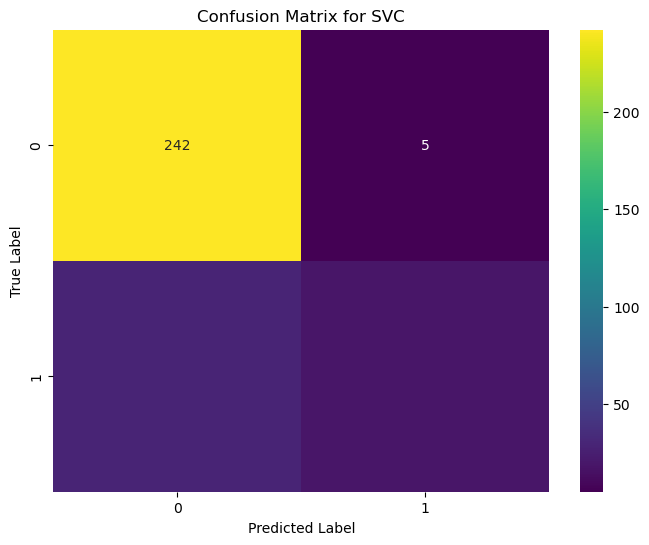

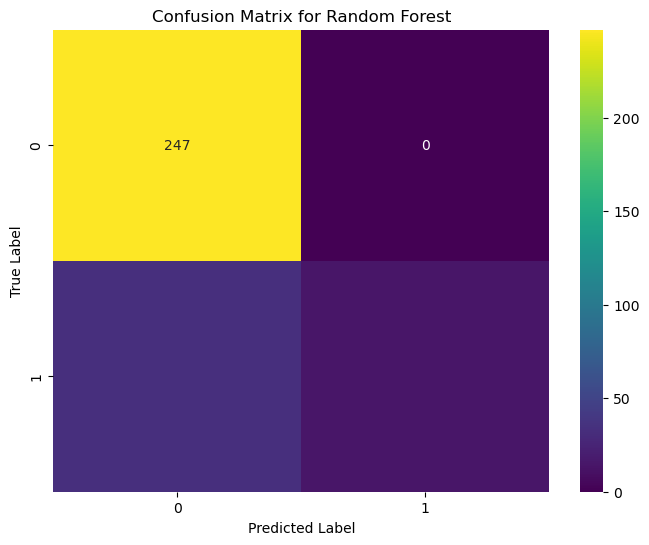

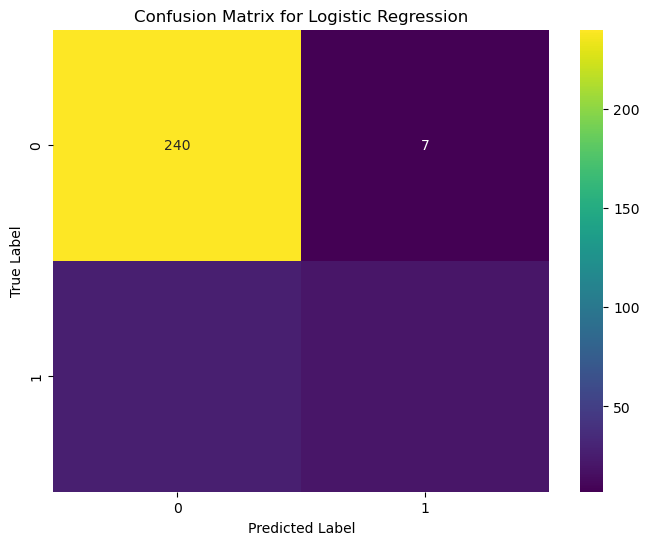

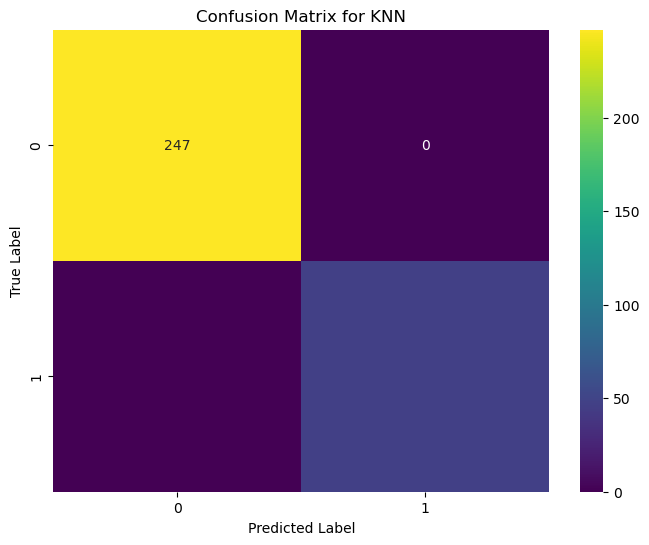

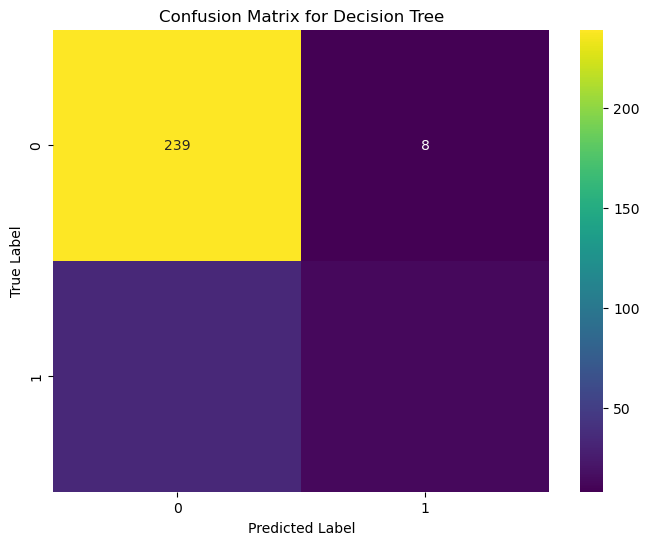

In [356]:
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import confusion_matrix, accuracy_score
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


param_grids = {
    'SVC': {
        'model__C': [1, 10],
        'model__kernel': ['linear', 'rbf']
    },
    'Random Forest': {
        'model__n_estimators': [50, 100, 200, 300],
        'model__max_depth': range(1,10),
        'model__min_samples_split': range(1,10),
        'model__min_samples_leaf': range(1,5)
    },
    'Logistic Regression': {
        'model__C': [1, 10],
        'model__solver': ['liblinear', 'lbfgs']
    },
    'KNN': {
        'model__n_neighbors': range(1,10),
        'model__weights': ['uniform', 'distance'],
        'model__metric': ['euclidean', 'manhattan']
    },
    'Decision Tree': {
        'model__criterion': ['gini', 'entropy'],
        'model__max_depth': range(1,10),
        'model__min_samples_split': range(1,10),
        'model__min_samples_leaf' : range(1,5)

    }
}


models = {
    'SVC': SVC(),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Logistic Regression': LogisticRegression(),
    'KNN': KNeighborsClassifier(),
    'Decision Tree' : DecisionTreeClassifier(random_state=42)
}


results = []
confusion_matrices = {}


for model_name, model in models.items():

    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('model', model)
    ])

    # Perform GridSearchCV
    Random_search = RandomizedSearchCV(pipeline, param_grids[model_name], cv=5, n_jobs=-1, scoring='accuracy')
    Random_search.fit(X, y)


    best_params = Random_search.best_params_
    best_model = Random_search.best_estimator_


    train_predictions = best_model.predict(X_train)
    test_predictions = best_model.predict(X_test)

    train_accuracy = accuracy_score(y_train, train_predictions)
    test_accuracy = accuracy_score(y_test, test_predictions)


    cm = confusion_matrix(y_test, test_predictions)
    confusion_matrices[model_name] = cm


    results.append({
        'Model': model_name,
        'Best Parameters': best_params,
        'Train Accuracy': train_accuracy,
        'Test Accuracy': test_accuracy
    })
    print(f"Results for {model_name}:")
    print(f"Best Parameters: {best_params}")
    print("\n")


results_df = pd.DataFrame(results)

print(results_df)


for model_name, cm in confusion_matrices.items():
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='viridis', xticklabels=True, yticklabels=True)
    plt.title(f'Confusion Matrix for {model_name}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()


By leveraging data preprocessing techniques, feature engineering, and multiple classification algorithms, the project identified the most 
significant predictors of employee turnover, such as job satisfaction, work-life balance, and years at the company. The Random Forest and 
Logistic Regression models, optimized through hyperparameter tuning, provided the best performance, achieving high accuracy and AUC scores.
These insights enable organizations to make data-driven decisions, implement effective employee retention strategies, and reduce turnover costs.